In [1]:
import numpy as np
from qpsolvers import solve_qp
from scipy.integrate import solve_ivp


In [2]:
from casadi import *
from torch import nn
import torch
from matplotlib import pyplot as plt
import torch.nn.functional as F



In [3]:
class AAC:
    def __init__(self, m, c_d, f0, f1, f2, v_ego):
        self.m = m
        self.c_d = c_d
        self.f0 = f0
        self.f1 = f1
        self.f2 = f2
        self.v_ego = v_ego
        self.u = 0
        
        
    def update(self, x0, u, t, dt):
        
        x = MX.sym('x',3) # Three states
        
        p = x[0]
        v = x[1]
        z = x[2]
        
        
        Fr = self.f0 * v**2 + self.f1 * v + self.f2
        
        f = vertcat(
            v,
            -1/self.m*Fr,
            self.v_ego - v           
        )
        g = vertcat([
            0,
            1/self.m *u,
            0
        ])
        

        dx = f + g
        
        ode = {}         # ODE declaration
        ode['x']   = x   # states
        ode['ode'] = dx # right-hand side 

        # Construct a Function that integrates over 4s
        F = integrator('F','cvodes',ode,{'t0':t,'tf':t+dt})

        res = F(x0=x0)
        
        x_n = res['xf'].elements()
        
        return x_n 
        
        

In [22]:
class LQPCBFCLF:
    def __init__(self, m_nom, ca_nom, cd_nom, f0_nom, f1_nom, f2_nom, v_ego_nom, v_des, Th, clf_rate, cbf_rate, p_slack):
        self.m = m_nom
        self.ca = ca_nom
        self.cd = cd_nom
        self.f0 = f0_nom
        self.f1 = f1_nom
        self.f2 = f2_nom
        self.v_ego = v_ego_nom 
        self.v_des = v_des
        self.Th = Th
        
        self.p_slack = p_slack
        self.cbf_rate = cbf_rate
        self.clf_rate = clf_rate
        
        
    def clf(self, symb_x):
        v = symb_x[1]        

        clf = (v - self.v_des)**2;
        return clf
        
    def cbf(self, symb_x):
        v = symb_x[1]
        z = symb_x[2]

        cbf = z - self.Th * v - 0.5  * (self.v_ego - v)**2 / (self.cd * 9.81);
        return cbf
        

    def dcbf(self, x, u):
        v = x[1]
        z = x[2]
        
        Fr = self.f0 * v**2 + self.f1 * v + self.f2

        dB = 1/self.m * (self.Th + (v - self.v_ego)/self.cd/9.81 ) * (Fr - u) + (self.v_ego - v)
        
        return dB
        
    def compute_controller(self, x, u_ref, A_h, B_h, weights, t):
        v = x[1]
        z = x[2]

        u = SX.sym('u')
        slack = SX.sym('slack')
        
        Fr = self.f0 * v**2 + self.f1 * v + self.f2
        
        V = self.clf(x)
        dV = (v - self.v_des)*(2/self.m*(u - u_ref))

        B = self.cbf(x);
        
        v_ego = self.v_ego + 3*np.sin(3.*t)
        dB = 1/self.m * (self.Th + (v - v_ego)/self.cd/9.81 ) * (Fr - u) + (v_ego - v)
        
        a_h = A_h.forward(x)
        b_h = B_h.forward(x)
        
        S = dB + a_h + b_h * u
        
        weight_input = 2/self.m**2
        
        fqp = (u_ref - u)**2 * weight_input + self.p_slack * slack**2
        gqp = vertcat( -dV - self.clf_rate*V + slack, S + self.cbf_rate * B)
        
        # Optimization
        qp = {'x': vertcat(u,slack), 'f':fqp, 'g':gqp}
        
        S = nlpsol('S', 'ipopt', qp,{'verbose':False,'print_time':False})
             

        r = S(lbg=0, lbx = -m*self.cd*g, ubx = m*self.ca*g)
        
        k = r['x'].elements()[0]
        slack_sol = r['x'].elements()[1]
        
        return a_h, b_h, k, slack_sol, V, B, dB

In [5]:
from collections import deque, namedtuple
import random
import torch

Transition = namedtuple('Transition',
                        ('x', 'k', 'dh', 'dh_hat'))


class Dataset:
    def __init__(self):
        #self.capacity = capacity 
        self.D = deque()
        
    def reset(self):
        self.D = deque()
    
    def update(self, *args):
        self.D.append(Transition(*args))
        
    def get_D(self):
        sample = Transition(*zip(*self.D))
        return sample
        
    

In [11]:
def sample_initial_state(p_min = 0, p_max = 2,
                         v_min = 18, v_max = 22,
                         z_min = 38, z_max = 42):
    p0 = np.random.uniform(p_min, p_max)
    v0 = np.random.uniform(v_min, v_max)
    z0 = np.random.uniform(z_min, z_max)
    return [p0, v0, z0] # [0,20,40]##

class Derivator:
    def __init__(self, dt):
        self.x = 0
        self.dt = dt
        
    def update(self, x_n):
        dx = (x_n - self.x)/dt
        
        self.x = x_n
        
        
        return dx
    

In [12]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Linear') != -1:
        m.weight.data.fill_(0.0)
        m.bias.data.fill_(0.0)

class Estimator:
    def __init__(self, input_size, output_size = 1):
        f1 = 50
        f2 = 50
        
        self.model = nn.Sequential(
                                  nn.Linear(input_size, f1),                   nn.Sigmoid(),
                                  nn.Linear(f1, f2),                           nn.Sigmoid(),
                                  nn.Linear(f2, output_size)
                                )
        
        self.model.apply(weights_init)
        
    def forward(self, x, train = False):
        x = torch.from_numpy(np.array(x)).float()
        #print(x)
        z = self.model(x)
        
        if not train:
            z = z.detach().float().item()
            
        return z

# Different cases

In [13]:
dt = 0.02
simTime = 10

# Real parameters
v_ego = 22
v_des = 24
m  = 1650.0
g = 9.81

# 
f0 = 0.1
f1 = 5
f2 = 0.25
#

c_a = 0.3
c_d = 0.3
Th = 1.8

# Nominal parameters
f0_nom = 10*f0
f1_nom = 10*f1
f2_nom = 10*f2

p_slack = 2e-2
clf_rate = 5
cbf_rate = 5.

# Initial state
p0 = 0
v0 = 20
z0 = 40

x = [p0, v0 ,z0]

x_lst = []
u_lst = []
V_lst = []
B_lst = []
slack_lst = []


In [23]:
d = Dataset()
T = 10   # Number of experiences

aac = AAC(m, c_d, f0, f1, f2, v_ego)

cont = LQPCBFCLF(0.8*m, c_a, c_d, f0_nom, f1_nom, f2_nom, v_ego, v_des, Th, clf_rate, cbf_rate, p_slack)

A_h = Estimator(3)
A_h_opt = torch.optim.Adam(A_h.model.parameters(), lr = 1e-4)

B_h = Estimator(3)
B_h_opt = torch.optim.Adam(B_h.model.parameters(), lr = 1e-4)


weights = 0.2

x_lst = []
u_lst = []
V_lst = []
B_lst = []
B_perf_lst = []
slack_lst = []


a_h_lst = []
b_h_lst = []


for _ in range(T):
    x0 = sample_initial_state()
    x = x0
    derivator = Derivator(dt)
    
    xs = []
    us = []
    Vs = []
    Bs = []
    B_perfs = []
    slacks = []
    b_hs = []
    a_hs = []
    
    for t in np.arange(0, simTime, dt): #simTime
        # Get Fr
        v = x[1]
        Fr = f0_nom * v**2 + f1_nom * v + f2_nom

        # Control Input
        a_h, b_h, k, slack_sol, V, B, db_hat = cont.compute_controller(x, Fr, A_h, B_h, weights, t)
        
        B_perf = x[2] - Th * x[1] - 0.5  * (v_ego - x[1])**2 / (c_d * 9.81)

        # One step propagation in the system
        x_n = aac.update(x, k, t, dt)
        
        db = derivator.update(B)
        
        d.update(x, k, db, db_hat)
        
        xs.append(x)
        us.append(k)
        Vs.append(V)
        Bs.append(B)
        slacks.append(slack_sol)
        a_hs.append(a_h)
        b_hs.append(b_h)
        B_perfs.append(B_perf)
        
        x = x_n
        
        
    # Save data
    x_lst.append(xs)
    u_lst.append(us)
    V_lst.append(Vs)
    B_lst.append(Bs)
    slack_lst.append(slacks)
    a_h_lst.append(a_hs)
    b_h_lst.append(b_hs)
    B_perf_lst.append(B_perfs)

    # Train estimator
    sample = d.get_D()
        
    for x_i, k_i, dh_i, dh_hat_i in zip(sample.x, sample.k, sample.dh, sample.dh_hat ):
        S_i = A_h.forward(x_i, train = True) + B_h.forward(x_i, train = True)*k_i + cont.dcbf(x_i, k_i) # dh_hat_i
        
        Loss = F.mse_loss(torch.tensor(dh_i),S_i)

        A_h.model.zero_grad()
        B_h.model.zero_grad()

        Loss.backward()
        A_h_opt.step()
        B_h_opt.step()
    
        
        



This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   3  4.5034257e+00 0.00e+00 9.93e-03  -1.0 4.81e+01    -  9.91e-01 1.00e+00f  1
   4  4.2144411e+00 0.00e+00 2.83e-08  -2.5 4.75e+01    -  1.00e+00 1.00e+00f  1
   5  4.1995722e+00 0.00e+00 1.50e-09  -3.8 2.19e+00    -  1.00e+00 1.00e+00f  1
   6  4.1992485e+00 0.00e+00 1.84e-11  -5.7 3.99e-02    -  1.00e+00 1.00e+00f  1
   7  4.1992448e+00 0.00e+00 2.51e-14  -8.6 4.56e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   4.1992447808664277e+00    4.1992447808664277e+00
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5071139749951334e-09    2.5071139749951334e-09
Overall NLP error.......:   2.5071139749951334e-09    2.5071139749951334e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations          

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   1  4.8208377e+00 0.00e+00 7.55e-03  -1.0 9.57e+00    -  9.88e-01 1.00e+00h  1
   2  3.9676215e+00 0.00e+00 3.69e-01  -1.0 4.11e+02    -  9.15e-01 5.15e-01f  1
   3  4.2708102e+00 0.00e+00 4.17e-02  -1.0 6.79e+01    -  9.85e-01 1.00e+00f  1
   4  3.9440003e+00 0.00e+00 2.00e-07  -1.7 6.25e+01    -  1.00e+00 1.00e+00f  1
   5  3.8923389e+00 0.00e+00 1.50e-09  -3.8 7.51e+00    -  1.00e+00 1.00e+00f  1
   6  3.8916820e+00 0.00e+00 1.84e-11  -5.7 7.96e-02    -  1.00e+00 1.00e+00f  1
   7  3.8916783e+00 0.00e+00 2.51e-14  -8.6 4.77e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   3.8916782962480725e+00    3.8916782962480725e+00
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5072774894028085e-09    2.5072774894028085e-09
Overall NLP error.......


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number of Lagrangian Hessian evaluations             = 7
Total CPU secs in IPOPT (w/o function evaluations)   =      0.006
Total CPU secs in NLP function evaluations           =      0.001

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with o

   1  3.1641902e+00 1.08e+01 6.43e+01  -1.0 1.70e+02    -  9.57e-01 1.67e-02h  1
   2  9.5967342e+00 0.00e+00 6.57e+00  -1.0 7.10e+02    -  8.65e-01 1.00e+00h  1
   3  9.6155316e+00 0.00e+00 1.46e-01  -1.0 3.46e+00    -  9.92e-01 1.00e+00f  1
   4  9.5262144e+00 0.00e+00 2.00e-07  -1.7 1.74e+00    -  1.00e+00 1.00e+00f  1
   5  9.4853543e+00 0.00e+00 1.50e-09  -3.8 3.16e+00    -  1.00e+00 1.00e+00f  1
   6  9.4849390e+00 0.00e+00 1.84e-11  -5.7 2.93e-02    -  1.00e+00 1.00e+00f  1
   7  9.4849353e+00 0.00e+00 2.50e-14  -8.6 2.90e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   9.4849352523962942e+00    9.4849352523962942e+00
Dual infeasibility......:   2.5035529205297280e-14    2.5035529205297280e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5065489963746058e-09    2.5065489963746058e-09
Overall NLP error.......

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   2  1.3032777e+01 0.00e+00 4.62e+00  -1.0 5.10e+02    -  8.98e-01 1.00e+00h  1
   3  1.3053494e+01 0.00e+00 9.25e-02  -1.0 3.00e+00    -  9.92e-01 1.00e+00f  1
   4  1.2967755e+01 0.00e+00 2.00e-07  -1.7 9.35e-01    -  1.00e+00 1.00e+00f  1
   5  1.2927520e+01 0.00e+00 1.50e-09  -3.8 2.90e+00    -  1.00e+00 1.00e+00f  1
   6  1.2927157e+01 0.00e+00 1.84e-11  -5.7 2.61e-02    -  1.00e+00 1.00e+00f  1
   7  1.2927153e+01 0.00e+00 2.53e-14  -8.6 2.67e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.2927153343581567e+01    1.2927153343581567e+01
Dual infeasibility......:   2.5313084961453569e-14    2.5313084961453569e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061884572916578e-09    2.5061884572916578e-09
Overall NLP error.......:   2.5061884572916578e-09    2.5061884572916578e-09


Number of objective functi

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   4  8.0271861e+00 0.00e+00 1.00e-06  -1.0 2.42e+01    -  1.00e+00 1.00e+00f  1
   5  7.8281330e+00 0.00e+00 2.83e-08  -2.5 2.37e+01    -  1.00e+00 1.00e+00f  1
   6  7.8200936e+00 0.00e+00 1.50e-09  -3.8 1.00e+00    -  1.00e+00 1.00e+00f  1
   7  7.8197921e+00 0.00e+00 1.84e-11  -5.7 3.50e-02    -  1.00e+00 1.00e+00f  1
   8  7.8197884e+00 0.00e+00 2.51e-14  -8.6 4.26e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   7.8197884008627039e+00    7.8197884008627039e+00
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5064494379750786e-09    2.5064494379750786e-09
Overall NLP error.......:   2.5064494379750786e-09    2.5064494379750786e-09


Number of objective function evaluations             = 13
Number of objective gradient evaluations         

   1  9.4885888e+00 0.00e+00 1.15e-02  -1.0 1.81e+01    -  9.86e-01 1.00e+00h  1
   2  6.5016364e+00 0.00e+00 1.43e-02  -1.0 6.43e+02    -  8.76e-01 1.00e+00f  1
   3  6.0077209e+00 0.00e+00 1.34e+00  -1.0 5.92e+02    -  9.99e-01 2.26e-01f  1
   4  6.2007753e+00 0.00e+00 1.00e-06  -1.0 5.31e+01    -  1.00e+00 1.00e+00f  1
   5  5.9208894e+00 0.00e+00 2.83e-08  -2.5 5.15e+01    -  1.00e+00 1.00e+00f  1
   6  5.9063592e+00 0.00e+00 1.50e-09  -3.8 2.91e+00    -  1.00e+00 1.00e+00f  1
   7  5.9060363e+00 0.00e+00 1.84e-11  -5.7 4.85e-02    -  1.00e+00 1.00e+00f  1
   8  5.9060326e+00 0.00e+00 2.53e-14  -8.6 5.26e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   5.9060325902134876e+00    5.9060325902134876e+00
Dual infeasibility......:   2.5313084961453569e-14    2.5313084961453569e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.....

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   1  2.9871290e+00 1.95e+01 6.21e+01  -1.0 2.13e+02    -  9.48e-01 1.72e-02h  1
   2  1.5056461e+01 0.00e+00 5.95e+00  -1.0 6.19e+02    -  8.80e-01 1.00e+00h  1
   3  1.5077034e+01 0.00e+00 1.26e-01  -1.0 3.16e+00    -  9.92e-01 1.00e+00f  1
   4  1.4985758e+01 0.00e+00 2.00e-07  -1.7 1.60e+00    -  1.00e+00 1.00e+00f  1
   5  1.4945459e+01 0.00e+00 1.50e-09  -3.8 2.71e+00    -  1.00e+00 1.00e+00f  1
   6  1.4945105e+01 0.00e+00 1.84e-11  -5.7 2.39e-02    -  1.00e+00 1.00e+00f  1
   7  1.4945101e+01 0.00e+00 2.51e-14  -8.6 2.49e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.4945100955130783e+01    1.4945100955130783e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061448433465141e-09    2.5061448433465141e-09
Overall NLP error.......

   6  1.7004624e+01 0.00e+00 1.50e-09  -3.8 4.20e-01    -  1.00e+00 1.00e+00f  1
   7  1.7004325e+01 0.00e+00 1.84e-11  -5.7 1.92e-02    -  1.00e+00 1.00e+00f  1
   8  1.7004322e+01 0.00e+00 2.50e-14  -8.6 2.37e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   1.7004321735326833e+01    1.7004321735326833e+01
Dual infeasibility......:   2.4980018054066022e-14    2.4980018054066022e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061254048430603e-09    2.5061254048430603e-09
Overall NLP error.......:   2.5061254048430603e-09    2.5061254048430603e-09


Number of objective function evaluations             = 9
Number of objective gradient evaluations             = 9
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 9
Number of equality constraint Jacobian ev

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   1  1.6217352e+01 0.00e+00 4.87e-03  -1.0 2.59e+01    -  9.85e-01 1.00e+00h  1
   2  1.6095111e+01 0.00e+00 1.20e+00  -1.0 5.03e+01    -  9.81e-01 3.55e-01f  2
   3  1.6068260e+01 0.00e+00 1.00e-06  -1.0 3.69e+00    -  1.00e+00 1.00e+00f  1
   4  1.5877462e+01 0.00e+00 2.83e-08  -2.5 1.40e+01    -  1.00e+00 1.00e+00f  1
   5  1.5870913e+01 0.00e+00 1.50e-09  -3.8 5.01e-01    -  1.00e+00 1.00e+00f  1
   6  1.5870614e+01 0.00e+00 1.84e-11  -5.7 2.23e-02    -  1.00e+00 1.00e+00f  1
   7  1.5870610e+01 0.00e+00 2.49e-14  -8.6 2.75e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.5870610278447501e+01    1.5870610278447501e+01
Dual infeasibility......:   2.4868995751603507e-14    2.4868995751603507e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061654491653905e-09    2.5061654491653905e-09
Overall NLP error.......

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

Objective...............:   7.7075067510514632e+00    7.7075067510514632e+00
Dual infeasibility......:   2.5313084961453569e-14    2.5313084961453569e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5067945392470884e-09    2.5067945392470884e-09
Overall NLP error.......:   2.5067945392470884e-09    2.5067945392470884e-09


Number of objective function evaluations             = 15
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 15
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 10
Number of Lagrangian Hessian evaluations             = 9
Total CPU secs in IPOPT (w/o function evaluations)   =      0.006
Total CPU secs in NLP function evaluations           =      0.001

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with line

Number of inequality constraint Jacobian evaluations = 9
Number of Lagrangian Hessian evaluations             = 8
Total CPU secs in IPOPT (w/o function evaluations)   =      0.002
Total CPU secs in NLP function evaluations           =      0.000

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
   

   3  1.1920655e+01 0.00e+00 1.00e-06  -1.0 7.63e+00    -  1.00e+00 1.00e+00f  1
   4  1.1737152e+01 0.00e+00 2.83e-08  -2.5 1.41e+01    -  1.00e+00 1.00e+00f  1
   5  1.1730325e+01 0.00e+00 1.50e-09  -3.8 5.52e-01    -  1.00e+00 1.00e+00f  1
   6  1.1730026e+01 0.00e+00 1.84e-11  -5.7 2.42e-02    -  1.00e+00 1.00e+00f  1
   7  1.1730022e+01 0.00e+00 2.50e-14  -8.6 2.98e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.1730022096275608e+01    1.1730022096275608e+01
Dual infeasibility......:   2.4980018054066022e-14    2.4980018054066022e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5062120543132270e-09    2.5062120543132270e-09
Overall NLP error.......:   2.5062120543132270e-09    2.5062120543132270e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations          

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.8444763e+00 2.78e+01 5.00e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  1.8413362e+01 0.00e+00 4.72e-02  -1.0 2.79e+01    -  9.84e-01 

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   1  1.5049280e+01 0.00e+00 1.36e-02  -1.0 2.47e+01    -  9.85e-01 1.00e+00h  1
   2  1.0962313e+01 0.00e+00 1.34e-02  -1.0 7.28e+02    -  8.63e-01 1.00e+00f  1
   3  9.0763884e+00 0.00e+00 1.88e-01  -1.0 1.06e+03    -  9.53e-01 4.41e-01f  1
   4  9.3533109e+00 0.00e+00 1.60e+00  -1.0 1.58e+02    -  9.66e-01 5.00e-01f  2
   5  9.1746680e+00 0.00e+00 1.00e-06  -1.0 5.07e+01    -  1.00e+00 1.00e+00f  1
   6  8.9709953e+00 0.00e+00 2.83e-08  -2.5 3.14e+01    -  1.00e+00 1.00e+00f  1
   7  8.9619586e+00 0.00e+00 1.50e-09  -3.8 1.60e+00    -  1.00e+00 1.00e+00f  1
   8  8.9616532e+00 0.00e+00 1.84e-11  -5.7 4.59e-02    -  1.00e+00 1.00e+00f  1
   9  8.9616495e+00 0.00e+00 2.50e-14  -8.6 5.46e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   8.9616494674988783e+00    8.9616494674988783e+00
Dual infeasibility......:   2.4980018054066022e-14    2.4980018054066022e-14
Constraint viola

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

/home/emanuelsamir/.local/lib/python3.6/site-packages/ipykernel_launcher.py:88: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.


This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   5  1.9338007e+01 0.00e+00 1.00e-06  -1.0 2.72e+02    -  1.00e+00 1.00e+00f  1
   6  1.9252768e+01 0.00e+00 2.00e-07  -1.7 6.04e+01    -  1.00e+00 1.00e+00f  1
   7  1.9234685e+01 0.00e+00 2.83e-08  -2.5 5.72e+00    -  1.00e+00 1.00e+00f  1
   8  1.9231981e+01 0.00e+00 1.50e-09  -3.8 4.93e-01    -  1.00e+00 1.00e+00f  1
   9  1.9231832e+01 0.00e+00 1.84e-11  -5.7 2.61e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.9231830e+01 0.00e+00 2.51e-14  -8.6 3.22e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 10

                                   (scaled)                 (unscaled)
Objective...............:   1.9231830175146332e+01    1.9231830175146332e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5063233543382587e-09    2.5063233543382587e-09
Overall NLP error......

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   2  1.7579693e+01 0.00e+00 5.34e+00  -1.0 5.88e+02    -  8.85e-01 1.00e+00h  1
   3  1.7603352e+01 0.00e+00 1.11e-01  -1.0 3.43e+00    -  9.92e-01 1.00e+00f  1
   4  1.7507043e+01 0.00e+00 2.00e-07  -1.7 2.14e+00    -  1.00e+00 1.00e+00f  1
   5  1.7466755e+01 0.00e+00 1.50e-09  -3.8 2.57e+00    -  1.00e+00 1.00e+00f  1
   6  1.7466409e+01 0.00e+00 1.84e-11  -5.7 2.22e-02    -  1.00e+00 1.00e+00f  1
   7  1.7466405e+01 0.00e+00 2.51e-14  -8.6 2.35e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.7466405215905269e+01    1.7466405215905269e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061219583106979e-09    2.5061219583106979e-09
Overall NLP error.......:   2.5061219583106979e-09    2.5061219583106979e-09


Number of objective functi

   4  1.8923154e+01 0.00e+00 2.00e-07  -1.7 2.65e+00    -  1.00e+00 1.00e+00f  1
   5  1.8882898e+01 0.00e+00 1.50e-09  -3.8 2.56e+00    -  1.00e+00 1.00e+00f  1
   6  1.8882556e+01 0.00e+00 1.84e-11  -5.7 2.20e-02    -  1.00e+00 1.00e+00f  1
   7  1.8882552e+01 0.00e+00 2.49e-14  -8.6 2.34e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.8882552325374693e+01    1.8882552325374693e+01
Dual infeasibility......:   2.4868995751603507e-14    2.4868995751603507e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061145889354745e-09    2.5061145889354745e-09
Overall NLP error.......:   2.5061145889354745e-09    2.5061145889354745e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequal

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   3  1.3149372e+01 0.00e+00 3.49e+00  -1.0 1.73e+02    -  9.55e-01 1.25e-01f  4
   4  1.3105407e+01 0.00e+00 1.00e-06  -1.0 8.30e+00    -  1.00e+00 1.00e+00f  1
   5  1.2910404e+01 0.00e+00 2.83e-08  -2.5 1.89e+01    -  1.00e+00 1.00e+00f  1
   6  1.2903336e+01 0.00e+00 1.50e-09  -3.8 7.26e-01    -  1.00e+00 1.00e+00f  1
   7  1.2903037e+01 0.00e+00 1.84e-11  -5.7 2.89e-02    -  1.00e+00 1.00e+00f  1
   8  1.2903033e+01 0.00e+00 2.50e-14  -8.6 3.55e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   1.2903033291607667e+01    1.2903033291607667e+01
Dual infeasibility......:   2.4980018054066022e-14    2.4980018054066022e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5062905876209326e-09    2.5062905876209326e-09
Overall NLP error.......:   2.5062905876209326e-09    2.5062905876209326e-09


Number of objective functi

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   1  1.1643078e+01 0.00e+00 1.06e-02  -1.0 2.09e+01    -  9.86e-01 1.00e+00h  1
   2  8.2196097e+00 0.00e+00 2.21e-02  -1.0 6.80e+02    -  8.70e-01 1.00e+00f  1
   3  7.2466413e+00 0.00e+00 1.29e+00  -1.0 8.67e+02    -  9.92e-01 2.92e-01f  1
   4  7.5763489e+00 0.00e+00 3.97e-02  -1.0 9.04e+01    -  9.94e-01 1.00e+00f  1
   5  7.1992712e+00 0.00e+00 2.00e-07  -1.7 8.21e+01    -  1.00e+00 1.00e+00f  1
   6  7.1457949e+00 0.00e+00 2.83e-08  -2.5 9.95e+00    -  1.00e+00 1.00e+00f  1
   7  7.1401221e+00 0.00e+00 1.50e-09  -3.8 8.39e-01    -  1.00e+00 1.00e+00f  1
   8  7.1398221e+00 0.00e+00 1.84e-11  -5.7 4.30e-02    -  1.00e+00 1.00e+00f  1
   9  7.1398184e+00 0.00e+00 2.51e-14  -8.6 5.27e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   7.1398184276142542e+00    7.1398184276142542e+00
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint viola

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   7  1.9900541e+01 0.00e+00 2.51e-14  -8.6 2.26e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.9900540743873869e+01    1.9900540743873869e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061050473641822e-09    2.5061050473641822e-09
Overall NLP error.......:   2.5061050473641822e-09    2.5061050473641822e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number of Lagrangian Hessian evaluations             = 7
Total CPU secs in IPOPT (w/o fun

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   2  1.2984353e+01 0.00e+00 1.47e-02  -1.0 7.48e+02    -  8.59e-01 1.00e+00f  1
   3  1.2235258e+01 0.00e+00 1.05e+00  -1.0 8.14e+02    -  9.92e-01 1.92e-01f  1
   4  1.2481564e+01 0.00e+00 2.42e-04  -1.0 5.30e+01    -  1.00e+00 1.00e+00f  1
   5  1.2176441e+01 0.00e+00 2.00e-07  -1.7 4.86e+01    -  1.00e+00 1.00e+00f  1
   6  1.2128902e+01 0.00e+00 1.50e-09  -3.8 5.89e+00    -  1.00e+00 1.00e+00f  1
   7  1.2128472e+01 0.00e+00 1.84e-11  -5.7 5.42e-02    -  1.00e+00 1.00e+00f  1
   8  1.2128468e+01 0.00e+00 2.53e-14  -8.6 4.05e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   1.2128468247083504e+01    1.2128468247083504e+01
Dual infeasibility......:   2.5313084961453569e-14    2.5313084961453569e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5063837518611313e-09    2.5063837518611313e-09
Overall NLP error.......

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   7  7.8911544e+00 0.00e+00 1.50e-09  -3.8 1.09e+00    -  1.00e+00 1.00e+00f  1
   8  7.8908525e+00 0.00e+00 1.84e-11  -5.7 3.83e-02    -  1.00e+00 1.00e+00f  1
   9  7.8908488e+00 0.00e+00 2.51e-14  -8.6 4.67e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   7.8908488124754452e+00    7.8908488124754452e+00
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5065363557395577e-09    2.5065363557395577e-09
Overall NLP error.......:   2.5065363557395577e-09    2.5065363557395577e-09


Number of objective function evaluations             = 14
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 14
Number of equality constraint Jacobian

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   6  1.6054094e+01 0.00e+00 1.84e-11  -5.7 2.36e-02    -  1.00e+00 1.00e+00f  1
   7  1.6054090e+01 0.00e+00 2.51e-14  -8.6 2.47e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.6054090479231771e+01    1.6054090479231771e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061376681762975e-09    2.5061376681762975e-09
Overall NLP error.......:   2.5061376681762975e-09    2.5061376681762975e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number o

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   6  1.9595078e+01 0.00e+00 1.84e-11  -5.7 1.98e-02    -  1.00e+00 1.00e+00f  1
   7  1.9595074e+01 0.00e+00 2.51e-14  -8.6 2.45e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.9595073930953969e+01    1.9595073930953969e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061212423290194e-09    2.5061212423290194e-09
Overall NLP error.......:   2.5061212423290194e-09    2.5061212423290194e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number o

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   9  1.0392444e+01 0.00e+00 2.53e-14  -8.6 4.96e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   1.0392443524502754e+01    1.0392443524502754e+01
Dual infeasibility......:   2.5313084961453569e-14    2.5313084961453569e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5065919943410878e-09    2.5065919943410878e-09
Overall NLP error.......:   2.5065919943410878e-09    2.5065919943410878e-09


Number of objective function evaluations             = 11
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 11
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 10
Number of Lagrangian Hessian evaluations             = 9
Total CPU secs in IPOPT (w/o

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   8  1.0146008e+01 0.00e+00 2.50e-14  -8.6 3.46e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   1.0146008371302109e+01    1.0146008371302109e+01
Dual infeasibility......:   2.4980018054066022e-14    2.4980018054066022e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5062888907554155e-09    2.5062888907554155e-09
Overall NLP error.......:   2.5062888907554155e-09    2.5062888907554155e-09


Number of objective function evaluations             = 10
Number of objective gradient evaluations             = 9
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 10
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 9
Number of Lagrangian Hessian evaluations             = 8
Total CPU secs in IPOPT (w/o f

                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.9432033e+00 2.15e+01 5.00e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  2.9752977e+00 2.03e+01 2.51e+01  -1.0 2.16e+01    -  9.86e-01 5.52e-02h  1
   2  1.4704130e+01 0.00e+00 6.70e-01  -1.0 3.73e+02    -  9.21e-01 1.00e+00h  1
   3  1.4735560e+01 0.00e+00 3.73e-03  -1.0 4.87e+00    -  9.99e-01 1.00e+00f  1
   4  1.4555359e+01 0.00e+00 2.83e-08  -2.5 1.19e+01    -  1.00e+00 1.00e+00f  1
 

Number of Lagrangian Hessian evaluations             = 7
Total CPU secs in IPOPT (w/o function evaluations)   =      0.006
Total CPU secs in NLP function evaluations           =      0.000

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:      

   1  2.8888063e+00 2.57e+01 5.27e+01  -1.0 1.98e+02    -  9.51e-01 2.08e-02h  1
   2  2.0522384e+01 0.00e+00 4.32e+00  -1.0 4.97e+02    -  9.00e-01 1.00e+00h  1
   3  2.0549632e+01 0.00e+00 8.45e-02  -1.0 3.60e+00    -  9.92e-01 1.00e+00f  1
   4  2.0450542e+01 0.00e+00 2.00e-07  -1.7 2.36e+00    -  1.00e+00 1.00e+00f  1
   5  2.0410298e+01 0.00e+00 1.50e-09  -3.8 2.45e+00    -  1.00e+00 1.00e+00f  1
   6  2.0409959e+01 0.00e+00 1.84e-11  -5.7 2.09e-02    -  1.00e+00 1.00e+00f  1
   7  2.0409955e+01 0.00e+00 2.51e-14  -8.6 2.23e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   2.0409955441132013e+01    2.0409955441132013e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061017084760651e-09    2.5061017084760651e-09
Overall NLP error.......

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  


Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   1.0753538161493005e+01    1.0753538161493005e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5065484224251093e-09    2.5065484224251093e-09
Overall NLP error.......:   2.5065484224251093e-09    2.5065484224251093e-09


Number of objective function evaluations             = 13
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 13
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 10
Number of Lagrangian Hessian evaluations             = 9
Total CPU secs in IPOPT (w/o function evaluations)   =      0.005
Total CPU secs in NLP function evaluations 

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number of Lagrangian Hessian evaluations             = 7
Total CPU secs in IPOPT (w/o function evaluations)   =      0.005
Total CPU secs in NLP function evaluations           =      0.000

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     var

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   6  1.8955942e+02 0.00e+00 2.83e-08  -2.5 1.01e+01    -  1.00e+00 1.00e+00f  1
   7  1.8955332e+02 0.00e+00 1.50e-09  -3.8 1.69e-01    -  1.00e+00 1.00e+00f  1
   8  1.8955302e+02 0.00e+00 1.84e-11  -5.7 7.57e-03    -  1.00e+00 1.00e+00f  1
   9  1.8955302e+02 0.00e+00 2.53e-14  -8.6 9.38e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   1.8955302016436556e+02    1.8955302016436556e+02
Dual infeasibility......:   2.5313084961453569e-14    2.5313084961453569e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5059777982933504e-09    2.5059777982933504e-09
Overall NLP error.......:   2.5059777982933504e-09    2.5059777982933504e-09


Number of objective function evaluations             = 10
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 0
Number of inequ

   7  1.0205680e+02 0.00e+00 2.83e-08  -2.5 3.25e+00    -  1.00e+00 1.00e+00f  1
   8  1.0205138e+02 0.00e+00 1.50e-09  -3.8 3.04e-01    -  1.00e+00 1.00e+00f  1
   9  1.0205108e+02 0.00e+00 1.84e-11  -5.7 1.66e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.0205108e+02 0.00e+00 2.51e-14  -8.6 2.06e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 10

                                   (scaled)                 (unscaled)
Objective...............:   1.0205107987987185e+02    1.0205107987987185e+02
Dual infeasibility......:   2.5059035600428338e-14    2.5059035600428338e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061489305192569e-09    2.5061489305192569e-09
Overall NLP error.......:   2.5061489305192569e-09    2.5061489305192569e-09


Number of objective function evaluations             = 11
Number of objective gradient evaluations        

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 10
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 10
Number of Lagrangian Hessian evaluations             = 9
Total CPU secs in IPOPT (w/o function evaluations)   =      0.002
Total CPU secs in NLP function evaluations           =      0.000

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     v

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

Objective...............:   1.1443762784446734e+00    1.1443762784446734e+00
Dual infeasibility......:   2.5059035587193448e-14    2.5059035587193448e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5077016647872469e-09    2.5077016647872469e-09
Overall NLP error.......:   2.5077016647872469e-09    2.5077016647872469e-09


Number of objective function evaluations             = 9
Number of objective gradient evaluations             = 9
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 9
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 9
Number of Lagrangian Hessian evaluations             = 8
Total CPU secs in IPOPT (w/o function evaluations)   =      0.006
Total CPU secs in NLP function evaluations           =      0.001

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear s

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number of Lagrangian Hessian evaluations             = 7
Total CPU secs in IPOPT (w/o function evaluations)   =      0.005
Total CPU secs in NLP function evaluations           =      0.000

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total numb

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   6  1.0619350e+01 0.00e+00 1.50e-09  -3.8 4.98e-01    -  1.00e+00 1.00e+00f  1
   7  1.0619048e+01 0.00e+00 1.84e-11  -5.7 2.18e-02    -  1.00e+00 1.00e+00f  1
   8  1.0619045e+01 0.00e+00 2.53e-14  -8.6 2.69e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   1.0619044526554319e+01    1.0619044526554319e+01
Dual infeasibility......:   2.5313084961453569e-14    2.5313084961453569e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5065919860021241e-09    2.5065919860021241e-09
Overall NLP error.......:   2.5065919860021241e-09    2.5065919860021241e-09


Number of objective function evaluations             = 9
Number of objective gradient evaluations             = 9
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 9
Number of equality constraint Jacobian ev

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   3  1.3730106e+01 0.00e+00 1.42e-01  -1.0 3.33e+00    -  9.92e-01 1.00e+00f  1
   4  1.3636691e+01 0.00e+00 2.00e-07  -1.7 1.96e+00    -  1.00e+00 1.00e+00f  1
   5  1.3596278e+01 0.00e+00 1.50e-09  -3.8 2.78e+00    -  1.00e+00 1.00e+00f  1
   6  1.3595916e+01 0.00e+00 1.84e-11  -5.7 2.47e-02    -  1.00e+00 1.00e+00f  1
   7  1.3595913e+01 0.00e+00 2.51e-14  -8.6 2.55e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.3595912647364054e+01    1.3595912647364054e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061937204367737e-09    2.5061937204367737e-09
Overall NLP error.......:   2.5061937204367737e-09    2.5061937204367737e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations          

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 12
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 9
Number of Lagrangian Hessian evaluations             = 8
Total CPU secs in IPOPT (w/o function evaluations)   =      0.011
Total CPU secs in NLP function evaluations           =      0.001

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     va

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   3  1.4925407e+01 0.00e+00 5.81e-02  -1.0 5.24e+00    -  9.94e-01 1.00e+00f  1
   4  1.4806732e+01 0.00e+00 2.00e-07  -1.7 5.40e+00    -  1.00e+00 1.00e+00f  1
   5  1.4766300e+01 0.00e+00 1.50e-09  -3.8 2.78e+00    -  1.00e+00 1.00e+00f  1
   6  1.4765945e+01 0.00e+00 1.84e-11  -5.7 2.45e-02    -  1.00e+00 1.00e+00f  1
   7  1.4765941e+01 0.00e+00 2.50e-14  -8.6 2.54e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.4765941350966290e+01    1.4765941350966290e+01
Dual infeasibility......:   2.4980018054066022e-14    2.4980018054066022e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061495748676866e-09    2.5061495748676866e-09
Overall NLP error.......:   2.5061495748676866e-09    2.5061495748676866e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations          

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.8516080e+00 2.73e+01 5.00e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  1.7764915e+01 0.00e+00 3.58e-03  -1.0 2.74e+01    -  9.84e-01 

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

Total CPU secs in IPOPT (w/o function evaluations)   =      0.005
Total CPU secs in NLP function evaluations           =      0.000

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   1  2.8946709e+00 2.54e+01 5.29e+01  -1.0 2.14e+02    -  9.48e-01 2.06e-02h  1
   2  2.0139380e+01 0.00e+00 4.36e+00  -1.0 4.96e+02    -  9.00e-01 1.00e+00h  1
   3  2.0165640e+01 0.00e+00 8.55e-02  -1.0 3.48e+00    -  9.92e-01 1.00e+00f  1
   4  2.0068439e+01 0.00e+00 2.00e-07  -1.7 2.15e+00    -  1.00e+00 1.00e+00f  1
   5  2.0028205e+01 0.00e+00 1.50e-09  -3.8 2.47e+00    -  1.00e+00 1.00e+00f  1
   6  2.0027865e+01 0.00e+00 1.84e-11  -5.7 2.11e-02    -  1.00e+00 1.00e+00f  1
   7  2.0027862e+01 0.00e+00 2.51e-14  -8.6 2.25e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   2.0027861683125924e+01    2.0027861683125924e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061043907117548e-09    2.5061043907117548e-09
Overall NLP error.......

   4  2.0245437e+01 0.00e+00 2.00e-07  -1.7 4.39e+00    -  1.00e+00 1.00e+00f  1
   5  2.0205199e+01 0.00e+00 1.50e-09  -3.8 2.54e+00    -  1.00e+00 1.00e+00f  1
   6  2.0204859e+01 0.00e+00 1.84e-11  -5.7 2.17e-02    -  1.00e+00 1.00e+00f  1
   7  2.0204856e+01 0.00e+00 2.51e-14  -8.6 2.32e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   2.0204855785381543e+01    2.0204855785381543e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061082758639931e-09    2.5061082758639931e-09
Overall NLP error.......:   2.5061082758639931e-09    2.5061082758639931e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequal

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

  10  7.9933114e+01 0.00e+00 2.53e-14  -8.6 3.14e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 10

                                   (scaled)                 (unscaled)
Objective...............:   7.9933114442843873e+01    7.9933114442843873e+01
Dual infeasibility......:   2.5313084961453569e-14    2.5313084961453569e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5063914367642703e-09    2.5063914367642703e-09
Overall NLP error.......:   2.5063914367642703e-09    2.5063914367642703e-09


Number of objective function evaluations             = 11
Number of objective gradient evaluations             = 11
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 11
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 11
Number of Lagrangian Hessian evaluations             = 10
Total CPU secs in IPOPT (w

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   3  5.3066886e+00 0.00e+00 3.29e-02  -1.0 1.03e+03    -  9.67e-01 6.83e-01f  1
   4  5.4513844e+00 0.00e+00 1.11e+00  -1.0 2.51e+02    -  9.45e-01 2.50e-01f  3
   5  5.4008215e+00 0.00e+00 1.00e-06  -1.0 2.22e+01    -  1.00e+00 1.00e+00f  1
   6  5.2061261e+00 0.00e+00 2.83e-08  -2.5 4.40e+01    -  1.00e+00 1.00e+00f  1
   7  5.1940962e+00 0.00e+00 1.50e-09  -3.8 3.55e+00    -  1.00e+00 1.00e+00f  1
   8  5.1937627e+00 0.00e+00 1.84e-11  -5.7 8.23e-02    -  1.00e+00 1.00e+00f  1
   9  5.1937590e+00 0.00e+00 2.51e-14  -8.6 8.47e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   5.1937589840307208e+00    5.1937589840307208e+00
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5078129337381457e-09    2.5078129337381457e-09
Overall NLP error.......

   3  8.0240406e+00 0.00e+00 1.07e+00  -1.0 1.04e+02    -  9.74e-01 5.00e-01f  2
   4  7.8755097e+00 0.00e+00 1.00e-06  -1.0 3.27e+01    -  1.00e+00 1.00e+00f  1
   5  7.6788917e+00 0.00e+00 2.83e-08  -2.5 2.18e+01    -  1.00e+00 1.00e+00f  1
   6  7.6710133e+00 0.00e+00 1.50e-09  -3.8 8.98e-01    -  1.00e+00 1.00e+00f  1
   7  7.6707121e+00 0.00e+00 1.84e-11  -5.7 3.28e-02    -  1.00e+00 1.00e+00f  1
   8  7.6707085e+00 0.00e+00 2.51e-14  -8.6 4.01e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   7.6707084575855360e+00    7.6707084575855360e+00
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5064000979183028e-09    2.5064000979183028e-09
Overall NLP error.......:   2.5064000979183028e-09    2.5064000979183028e-09


Number of objective functi

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   2  5.5798929e+00 0.00e+00 1.26e-02  -1.0 6.26e+02    -  8.79e-01 1.00e+00f  1
   3  5.0788332e+00 0.00e+00 1.11e+00  -1.0 5.88e+02    -  1.00e+00 2.44e-01f  1
   4  5.2743713e+00 0.00e+00 1.00e-06  -1.0 5.68e+01    -  1.00e+00 1.00e+00f  1
   5  4.9937132e+00 0.00e+00 2.83e-08  -2.5 5.48e+01    -  1.00e+00 1.00e+00f  1
   6  4.9780114e+00 0.00e+00 1.50e-09  -3.8 3.36e+00    -  1.00e+00 1.00e+00f  1
   7  4.9776801e+00 0.00e+00 1.84e-11  -5.7 5.36e-02    -  1.00e+00 1.00e+00f  1
   8  4.9776764e+00 0.00e+00 2.51e-14  -8.6 5.59e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   4.9776764437238494e+00    4.9776764437238494e+00
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5067911012710562e-09    2.5067911012710562e-09
Overall NLP error.......

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   1  3.2455625e+00 1.16e+01 1.10e+01  -1.0 1.47e+01    -  9.87e-01 1.99e-01h  1
   2  8.0135087e+00 0.00e+00 1.65e-02  -1.0 1.13e+02    -  9.69e-01 1.00e+00h  1
   3  8.0251944e+00 0.00e+00 1.00e-06  -1.0 2.21e+00    -  1.00e+00 1.00e+00f  1
   4  7.8357951e+00 0.00e+00 2.83e-08  -2.5 1.77e+01    -  1.00e+00 1.00e+00f  1
   5  7.8281156e+00 0.00e+00 1.50e-09  -3.8 7.03e-01    -  1.00e+00 1.00e+00f  1
   6  7.8278147e+00 0.00e+00 1.84e-11  -5.7 2.83e-02    -  1.00e+00 1.00e+00f  1
   7  7.8278110e+00 0.00e+00 2.51e-14  -8.6 3.48e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   7.8278109831023315e+00    7.8278109831023315e+00
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5063897201543085e-09    2.5063897201543085e-09
Overall NLP error.......

   7  1.1000252e+01 0.00e+00 2.50e-14  -8.6 2.84e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.1000252241181430e+01    1.1000252241181430e+01
Dual infeasibility......:   2.4980018054066022e-14    2.4980018054066022e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5062744671481899e-09    2.5062744671481899e-09
Overall NLP error.......:   2.5062744671481899e-09    2.5062744671481899e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number of Lagrangian Hessian evaluations             = 7
Total CPU secs in IPOPT (w/o fun

   3  1.3791543e+01 0.00e+00 1.28e-01  -1.0 3.67e+00    -  9.92e-01 1.00e+00f  1
   4  1.3694076e+01 0.00e+00 2.00e-07  -1.7 2.52e+00    -  1.00e+00 1.00e+00f  1
   5  1.3653628e+01 0.00e+00 1.50e-09  -3.8 2.79e+00    -  1.00e+00 1.00e+00f  1
   6  1.3653266e+01 0.00e+00 1.84e-11  -5.7 2.47e-02    -  1.00e+00 1.00e+00f  1
   7  1.3653263e+01 0.00e+00 2.58e-14  -8.6 2.55e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.3653262558375882e+01    1.3653262558375882e+01
Dual infeasibility......:   2.5757174171303632e-14    2.5757174171303632e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061891630330128e-09    2.5061891630330128e-09
Overall NLP error.......:   2.5061891630330128e-09    2.5061891630330128e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations          

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.9800669e+00 1.93e+01 5.00e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  2.9949932e+00 1.90e+01 6.78e+01  -1.0 2.27e+02    -  9.46e-01 1.55e-02h  1
   2  1.5153667e+01 0.00e+00 6.97e+00  -1.0 6.91e+02    -  8.68e-01 1.00e+00h  1
   3  1.5171515e+01 0.00e+00 1.54e-01  -1.0 2.83e+00    -  9.92e-01 1.00e+00f  1
   4  1.5082749e+0

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   6  9.9217387e+00 0.00e+00 1.50e-09  -3.8 9.17e-01    -  1.00e+00 1.00e+00f  1
   7  9.9214381e+00 0.00e+00 1.84e-11  -5.7 3.40e-02    -  1.00e+00 1.00e+00f  1
   8  9.9214344e+00 0.00e+00 2.53e-14  -8.6 4.16e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   9.9214344061564894e+00    9.9214344061564894e+00
Dual infeasibility......:   2.5313084961453569e-14    2.5313084961453569e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5064154568137480e-09    2.5064154568137480e-09
Overall NLP error.......:   2.5064154568137480e-09    2.5064154568137480e-09


Number of objective function evaluations             = 11
Number of objective gradient evaluations             = 9
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 11
Number of equality constraint Jacobian 

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   7  1.0751730e+01 0.00e+00 2.51e-14  -8.6 3.10e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.0751729548408063e+01    1.0751729548408063e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5062328396719048e-09    2.5062328396719048e-09
Overall NLP error.......:   2.5062328396719048e-09    2.5062328396719048e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number of Lagrangian Hessian evaluations             = 7
Total CPU secs in IPOPT (w/o fun

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.8675588e+00 2.62e+01 5.00e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  2.8976045e+00 2.55e+01 4.05e+01  -1.0 1.76e+02    -  9.55e-01 2.85e-02h  1
   2  1.9426600e+01 0.00e+00 2.65e+00  -1.0 3.61e+02    -  9.23e-01 1.00e+00h  1
   3  1.9461854e+01 0.00e+00 4.48e-02  -1.0 4.63e+00    -  9.93e-01 1.00e+00f  1
   4  1.9355425e+01 0.00e+00 2.00e-07  -1.7 3.40e+00    -  1.00e+00 1.00e+00f  1
 

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   6  1.6608287e+01 0.00e+00 1.84e-11  -5.7 2.30e-02    -  1.00e+00 1.00e+00f  1
   7  1.6608284e+01 0.00e+00 2.51e-14  -8.6 2.42e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.6608283668057016e+01    1.6608283668057016e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061309661839936e-09    2.5061309661839936e-09
Overall NLP error.......:   2.5061309661839936e-09    2.5061309661839936e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number o

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   9  1.0242312e+01 0.00e+00 2.53e-14  -8.6 4.96e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   1.0242312432266523e+01    1.0242312432266523e+01
Dual infeasibility......:   2.5313084961453569e-14    2.5313084961453569e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5065951532784490e-09    2.5065951532784490e-09
Overall NLP error.......:   2.5065951532784490e-09    2.5065951532784490e-09


Number of objective function evaluations             = 12
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 12
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 10
Number of Lagrangian Hessian evaluations             = 9
Total CPU secs in IPOPT (w/o

   8  7.2686199e+00 0.00e+00 1.84e-11  -5.7 5.09e-02    -  1.00e+00 1.00e+00f  1
   9  7.2686162e+00 0.00e+00 2.51e-14  -8.6 5.96e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   7.2686162349942789e+00    7.2686162349942789e+00
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5068838051002889e-09    2.5068838051002889e-09
Overall NLP error.......:   2.5068838051002889e-09    2.5068838051002889e-09


Number of objective function evaluations             = 11
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 11
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 10
Numb


Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.0118249265281541e+01    1.0118249265281541e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5062891936022284e-09    2.5062891936022284e-09
Overall NLP error.......:   2.5062891936022284e-09    2.5062891936022284e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number of Lagrangian Hessian evaluations             = 7
Total CPU secs in IPOPT (w/o function evaluations)   =      0.001
Total CPU secs in NLP function evaluations     

   5  1.4516343e+01 0.00e+00 1.50e-09  -3.8 4.66e-01    -  1.00e+00 1.00e+00f  1
   6  1.4516044e+01 0.00e+00 1.84e-11  -5.7 2.12e-02    -  1.00e+00 1.00e+00f  1
   7  1.4516040e+01 0.00e+00 2.66e-14  -8.6 2.62e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.4516040341691097e+01    1.4516040341691097e+01
Dual infeasibility......:   2.6645352591003757e-14    2.6645352591003757e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061583829240464e-09    2.5061583829240464e-09
Overall NLP error.......:   2.5061583829240464e-09    2.5061583829240464e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian ev


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number of Lagrangian Hessian evaluations             = 7
Total CPU secs in IPOPT (w/o function evaluations)   =      0.004
Total CPU secs in NLP function evaluations           =      0.000

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with o

   6  1.9830072e+01 0.00e+00 1.84e-11  -5.7 2.10e-02    -  1.00e+00 1.00e+00f  1
   7  1.9830068e+01 0.00e+00 2.51e-14  -8.6 2.25e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.9830068396803053e+01    1.9830068396803053e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061048966611051e-09    2.5061048966611051e-09
Overall NLP error.......:   2.5061048966611051e-09    2.5061048966611051e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number o

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   1  6.3315452e+00 0.00e+00 9.71e-03  -1.0 1.28e+01    -  9.87e-01 1.00e+00h  1
   2  4.6452080e+00 0.00e+00 5.00e-02  -1.0 5.46e+02    -  8.92e-01 7.29e-01f  1
   3  4.9232345e+00 0.00e+00 1.45e+00  -1.0 1.38e+02    -  9.67e-01 5.00e-01f  2
   4  4.7551137e+00 0.00e+00 1.00e-06  -1.0 4.46e+01    -  1.00e+00 1.00e+00f  1
   5  4.5558242e+00 0.00e+00 2.83e-08  -2.5 2.73e+01    -  1.00e+00 1.00e+00f  1
   6  4.5462993e+00 0.00e+00 1.50e-09  -3.8 1.28e+00    -  1.00e+00 1.00e+00f  1
   7  4.5459926e+00 0.00e+00 1.84e-11  -5.7 4.02e-02    -  1.00e+00 1.00e+00f  1
   8  4.5459889e+00 0.00e+00 2.50e-14  -8.6 4.85e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   4.5459889270982430e+00    4.5459889270982430e+00
Dual infeasibility......:   2.5035529205297280e-14    2.5035529205297280e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.....

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

Number of Lagrangian Hessian evaluations             = 7
Total CPU secs in IPOPT (w/o function evaluations)   =      0.007
Total CPU secs in NLP function evaluations           =      0.001

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:      

Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5062674864428050e-09    2.5062674864428050e-09
Overall NLP error.......:   2.5062674864428050e-09    2.5062674864428050e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number of Lagrangian Hessian evaluations             = 7
Total CPU secs in IPOPT (w/o function evaluations)   =      0.004
Total CPU secs in NLP function evaluations           =      0.000

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        

   6  1.4045737e+01 0.00e+00 1.50e-09  -3.8 4.52e-01    -  1.00e+00 1.00e+00f  1
   7  1.4045438e+01 0.00e+00 1.84e-11  -5.7 2.03e-02    -  1.00e+00 1.00e+00f  1
   8  1.4045434e+01 0.00e+00 2.58e-14  -8.6 2.50e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   1.4045434217467061e+01    1.4045434217467061e+01
Dual infeasibility......:   2.5757174171303632e-14    2.5757174171303632e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061830229797220e-09    2.5061830229797220e-09
Overall NLP error.......:   2.5061830229797220e-09    2.5061830229797220e-09


Number of objective function evaluations             = 9
Number of objective gradient evaluations             = 9
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 9
Number of equality constraint Jacobian ev

Total CPU secs in NLP function evaluations           =      0.001

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds: 

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   3  1.0969049e+01 0.00e+00 1.60e+00  -1.0 1.01e+02    -  9.73e-01 5.00e-01f  2
   4  1.0791334e+01 0.00e+00 1.00e-06  -1.0 3.40e+01    -  1.00e+00 1.00e+00f  1
   5  1.0593598e+01 0.00e+00 2.83e-08  -2.5 1.94e+01    -  1.00e+00 1.00e+00f  1
   6  1.0586297e+01 0.00e+00 1.50e-09  -3.8 7.42e-01    -  1.00e+00 1.00e+00f  1
   7  1.0585997e+01 0.00e+00 1.84e-11  -5.7 2.89e-02    -  1.00e+00 1.00e+00f  1
   8  1.0585994e+01 0.00e+00 2.53e-14  -8.6 3.55e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   1.0585993621411390e+01    1.0585993621411390e+01
Dual infeasibility......:   2.5313084961453569e-14    2.5313084961453569e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5063006471250359e-09    2.5063006471250359e-09
Overall NLP error.......:   2.5063006471250359e-09    2.5063006471250359e-09


Number of objective functi

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number of Lagrangian Hessian evaluations             = 7
Total CPU secs in IPOPT (w/o function evaluations)   =      0.003
Total CPU secs in NLP function evaluations           =      0.000

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with 

   3  1.7246600e+01 0.00e+00 1.25e-01  -1.0 3.09e+00    -  9.92e-01 1.00e+00f  1
   4  1.7154205e+01 0.00e+00 2.00e-07  -1.7 1.65e+00    -  1.00e+00 1.00e+00f  1
   5  1.7113948e+01 0.00e+00 1.50e-09  -3.8 2.58e+00    -  1.00e+00 1.00e+00f  1
   6  1.7113601e+01 0.00e+00 1.84e-11  -5.7 2.23e-02    -  1.00e+00 1.00e+00f  1
   7  1.7113597e+01 0.00e+00 2.58e-14  -8.6 2.36e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.7113597367927873e+01    1.7113597367927873e+01
Dual infeasibility......:   2.5757174171303632e-14    2.5757174171303632e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061242832358355e-09    2.5061242832358355e-09
Overall NLP error.......:   2.5061242832358355e-09    2.5061242832358355e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations          

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   9  7.1622918e+00 0.00e+00 2.51e-14  -8.6 5.26e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   7.1622918097471935e+00    7.1622918097471935e+00
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5066863001827592e-09    2.5066863001827592e-09
Overall NLP error.......:   2.5066863001827592e-09    2.5066863001827592e-09


Number of objective function evaluations             = 10
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 10
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 10
Number of Lagrangian Hessian evaluations             = 9
Total CPU secs in IPOPT (w/o

   4  1.0815170e+01 0.00e+00 1.50e-09  -3.8 3.70e+00    -  1.00e+00 1.00e+00f  1
   5  1.0814795e+01 0.00e+00 1.84e-11  -5.7 3.28e-02    -  1.00e+00 1.00e+00f  1
   6  1.0814792e+01 0.00e+00 2.51e-14  -8.6 3.19e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 6

                                   (scaled)                 (unscaled)
Objective...............:   1.0814791597608654e+01    1.0814791597608654e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5062442700155022e-09    2.5062442700155022e-09
Overall NLP error.......:   2.5062442700155022e-09    2.5062442700155022e-09


Number of objective function evaluations             = 7
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 7
Number of equality constraint Jacobian ev

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   1  1.4455552e+01 0.00e+00 1.33e-02  -1.0 2.41e+01    -  9.85e-01 1.00e+00h  1
   2  1.0469054e+01 0.00e+00 1.31e-02  -1.0 7.24e+02    -  8.63e-01 1.00e+00f  1
   3  8.2353073e+00 0.00e+00 1.34e-01  -1.0 1.09e+03    -  9.50e-01 5.46e-01f  1
   4  8.3942403e+00 0.00e+00 2.99e+00  -1.0 2.08e+02    -  9.52e-01 2.50e-01f  3
   5  8.3260457e+00 0.00e+00 1.00e-06  -1.0 2.24e+01    -  1.00e+00 1.00e+00f  1
   6  8.1289034e+00 0.00e+00 2.83e-08  -2.5 3.36e+01    -  1.00e+00 1.00e+00f  1
   7  8.1194402e+00 0.00e+00 1.50e-09  -3.8 1.94e+00    -  1.00e+00 1.00e+00f  1
   8  8.1191314e+00 0.00e+00 1.84e-11  -5.7 5.33e-02    -  1.00e+00 1.00e+00f  1
   9  8.1191277e+00 0.00e+00 2.50e-14  -8.6 6.24e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   8.1191276919665007e+00    8.1191276919665007e+00
Dual infeasibility......:   2.4980018054066022e-14    2.4980018054066022e-14
Constraint viola

   7  8.3985851e+00 0.00e+00 1.84e-11  -5.7 3.49e-02    -  1.00e+00 1.00e+00f  1
   8  8.3985815e+00 0.00e+00 2.51e-14  -8.6 4.26e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   8.3985814557308114e+00    8.3985814557308114e+00
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5064441249190326e-09    2.5064441249190326e-09
Overall NLP error.......:   2.5064441249190326e-09    2.5064441249190326e-09


Number of objective function evaluations             = 13
Number of objective gradient evaluations             = 9
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 13
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 9
Number

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   3  2.0065131e+01 0.00e+00 9.48e-02  -1.0 3.34e+00    -  9.92e-01 1.00e+00f  1
   4  1.9969089e+01 0.00e+00 2.00e-07  -1.7 2.00e+00    -  1.00e+00 1.00e+00f  1
   5  1.9928858e+01 0.00e+00 1.50e-09  -3.8 2.46e+00    -  1.00e+00 1.00e+00f  1
   6  1.9928518e+01 0.00e+00 1.84e-11  -5.7 2.10e-02    -  1.00e+00 1.00e+00f  1
   7  1.9928514e+01 0.00e+00 2.49e-14  -8.6 2.25e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.9928513911762963e+01    1.9928513911762963e+01
Dual infeasibility......:   2.4868995751603507e-14    2.4868995751603507e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061044806019141e-09    2.5061044806019141e-09
Overall NLP error.......:   2.5061044806019141e-09    2.5061044806019141e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations          

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   4  1.8788955e+01 0.00e+00 1.00e-06  -1.0 6.62e+02    -  1.00e+00 1.00e+00f  1
   5  1.8643153e+01 0.00e+00 1.00e-06  -1.0 2.63e+02    -  1.00e+00 1.00e+00f  1
   6  1.8559158e+01 0.00e+00 2.00e-07  -1.7 5.44e+01    -  1.00e+00 1.00e+00f  1
   7  1.8538474e+01 0.00e+00 1.50e-09  -3.8 5.20e+00    -  1.00e+00 1.00e+00f  1
   8  1.8538295e+01 0.00e+00 1.84e-11  -5.7 4.58e-02    -  1.00e+00 1.00e+00f  1
   9  1.8538293e+01 0.00e+00 2.51e-14  -8.6 2.80e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   1.8538292956407503e+01    1.8538292956407503e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5062579434022628e-09    2.5062579434022628e-09
Overall NLP error.......:   2.5062579434022628e-09    2.5062579434022628e-09


Number of objective functi

   9  9.2792762e+00 0.00e+00 2.51e-14  -8.6 1.23e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   9.2792761768107788e+00    9.2792761768107788e+00
Dual infeasibility......:   2.5059035587193448e-14    2.5059035587193448e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061589886867306e-09    2.5061589886867306e-09
Overall NLP error.......:   2.5061589886867306e-09    2.5061589886867306e-09


Number of objective function evaluations             = 10
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 10
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 10
Number of Lagrangian Hessian evaluations             = 9
Total CPU secs in IPOPT (w/o


Number of objective function evaluations             = 10
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 10
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 10
Number of Lagrangian Hessian evaluations             = 9
Total CPU secs in IPOPT (w/o function evaluations)   =      0.003
Total CPU secs in NLP function evaluations           =      0.000

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables wi

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  3.1286798e+00 1.20e+01 5.00e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  6.1753553e+00 0.00e+00 1.16e-01  -1.0 2.43e+01    -  9.85e-01 1.00e+00h  1
   2  6.2348595e+00 0.00e+00 5.11e-02  -1.0 2.50e+00    -  9.91e-01 1.00e+00f  1
   3  6.1044068e+00 0.00e+00 2.00e-07  -1.7 1.11e+01    -  1.00e+00 1.00e+00f  1
   4  6.0622006e+00 0.00e+00 1.50e-09  -3.8 4.46e+00    -  1.00e+00 1.00e+00f  1
   5  6.0617516e+00 0.00e+00 1.84e-11  -5.7 4.39e-02    -  1.00e+00 1.00e+00f  1
   6  6.0617479e+00 0.00e+00 2.50e-14  -8.6 3.87e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 6

 

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   8  4.4386309e+00 0.00e+00 2.58e-14  -8.6 5.22e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   4.4386309186028319e+00    4.4386309186028319e+00
Dual infeasibility......:   2.5757174171303632e-14    2.5757174171303632e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5067003233858593e-09    2.5067003233858593e-09
Overall NLP error.......:   2.5067003233858593e-09    2.5067003233858593e-09


Number of objective function evaluations             = 12
Number of objective gradient evaluations             = 9
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 12
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 9
Number of Lagrangian Hessian evaluations             = 8
Total CPU secs in IPOPT (w/o f

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   5  1.1271761e+01 0.00e+00 1.50e-09  -3.8 3.04e+00    -  1.00e+00 1.00e+00f  1
   6  1.1271383e+01 0.00e+00 1.84e-11  -5.7 2.74e-02    -  1.00e+00 1.00e+00f  1
   7  1.1271379e+01 0.00e+00 2.51e-14  -8.6 2.76e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.1271379292066960e+01    1.1271379292066960e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5062862756184483e-09    2.5062862756184483e-09
Overall NLP error.......:   2.5062862756184483e-09    2.5062862756184483e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian ev

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   8  1.1225240e+01 0.00e+00 2.51e-14  -8.6 3.53e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   1.1225240124200054e+01    1.1225240124200054e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5062934658696804e-09    2.5062934658696804e-09
Overall NLP error.......:   2.5062934658696804e-09    2.5062934658696804e-09


Number of objective function evaluations             = 11
Number of objective gradient evaluations             = 9
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 11
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 9
Number of Lagrangian Hessian evaluations             = 8
Total CPU secs in IPOPT (w/o f

   1  1.1809143e+01 0.00e+00 1.24e-02  -1.0 2.11e+01    -  9.86e-01 1.00e+00h  1
   2  8.3396165e+00 0.00e+00 1.12e-02  -1.0 6.86e+02    -  8.69e-01 1.00e+00f  1
   3  6.8823704e+00 0.00e+00 3.40e-01  -1.0 9.71e+02    -  9.74e-01 4.09e-01f  1
   4  7.1104143e+00 0.00e+00 2.00e+00  -1.0 1.40e+02    -  9.76e-01 5.00e-01f  2
   5  6.9800787e+00 0.00e+00 1.00e-06  -1.0 4.00e+01    -  1.00e+00 1.00e+00f  1
   6  6.7815636e+00 0.00e+00 2.83e-08  -2.5 3.23e+01    -  1.00e+00 1.00e+00f  1
   7  6.7721652e+00 0.00e+00 1.50e-09  -3.8 1.77e+00    -  1.00e+00 1.00e+00f  1
   8  6.7718577e+00 0.00e+00 1.84e-11  -5.7 4.99e-02    -  1.00e+00 1.00e+00f  1
   9  6.7718540e+00 0.00e+00 2.51e-14  -8.6 5.89e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   6.7718539786690108e+00    6.7718539786690108e+00
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint viola

   3  7.7766869e+00 0.00e+00 8.76e+00  -1.0 1.55e+02    -  9.62e-01 2.50e-01f  3
   4  7.6939483e+00 0.00e+00 1.00e-06  -1.0 1.97e+01    -  1.00e+00 1.00e+00f  1
   5  7.4975229e+00 0.00e+00 2.83e-08  -2.5 2.27e+01    -  1.00e+00 1.00e+00f  1
   6  7.4895476e+00 0.00e+00 1.50e-09  -3.8 9.56e-01    -  1.00e+00 1.00e+00f  1
   7  7.4892462e+00 0.00e+00 1.84e-11  -5.7 3.42e-02    -  1.00e+00 1.00e+00f  1
   8  7.4892425e+00 0.00e+00 2.51e-14  -8.6 4.18e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   7.4892424670116302e+00    7.4892424670116302e+00
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5064337503815957e-09    2.5064337503815957e-09
Overall NLP error.......:   2.5064337503815957e-09    2.5064337503815957e-09


Number of objective functi

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

Total CPU secs in NLP function evaluations           =      0.001

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds: 

   9  6.9946449e+00 0.00e+00 2.51e-14  -8.6 5.67e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   6.9946449057000875e+00    6.9946449057000875e+00
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5067989451238916e-09    2.5067989451238916e-09
Overall NLP error.......:   2.5067989451238916e-09    2.5067989451238916e-09


Number of objective function evaluations             = 11
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 11
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 10
Number of Lagrangian Hessian evaluations             = 9
Total CPU secs in IPOPT (w/o

   4  1.1315491e+01 0.00e+00 2.83e-08  -2.5 1.65e+01    -  1.00e+00 1.00e+00f  1
   5  1.1308461e+01 0.00e+00 1.50e-09  -3.8 5.99e-01    -  1.00e+00 1.00e+00f  1
   6  1.1308162e+01 0.00e+00 1.84e-11  -5.7 2.50e-02    -  1.00e+00 1.00e+00f  1
   7  1.1308158e+01 0.00e+00 2.84e-14  -8.6 3.08e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.1308158050652491e+01    1.1308158050652491e+01
Dual infeasibility......:   2.8421709430404007e-14    2.8421709430404007e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5062274001854476e-09    2.5062274001854476e-09
Overall NLP error.......:   2.5062274001854476e-09    2.5062274001854476e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequal

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   7  1.8752979e+01 0.00e+00 2.51e-14  -8.6 2.29e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.8752979263074153e+01    1.8752979263074153e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061120677302864e-09    2.5061120677302864e-09
Overall NLP error.......:   2.5061120677302864e-09    2.5061120677302864e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number of Lagrangian Hessian evaluations             = 7
Total CPU secs in IPOPT (w/o fun

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   2  1.7947324e+01 0.00e+00 8.83e-01  -1.0 4.39e+02    -  9.10e-01 3.19e-01f  1
   3  1.8145771e+01 0.00e+00 2.42e-02  -1.0 2.98e+01    -  9.90e-01 1.00e+00f  1
   4  1.7838102e+01 0.00e+00 2.83e-08  -2.5 3.05e+01    -  1.00e+00 1.00e+00f  1
   5  1.7829839e+01 0.00e+00 1.50e-09  -3.8 7.23e-01    -  1.00e+00 1.00e+00f  1
   6  1.7829540e+01 0.00e+00 1.84e-11  -5.7 2.18e-02    -  1.00e+00 1.00e+00f  1
   7  1.7829536e+01 0.00e+00 2.58e-14  -8.6 2.68e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.7829536312930514e+01    1.7829536312930514e+01
Dual infeasibility......:   2.5757174171303632e-14    2.5757174171303632e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061498163693758e-09    2.5061498163693758e-09
Overall NLP error.......:   2.5061498163693758e-09    2.5061498163693758e-09


Number of objective functi

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.9602038e+00 2.05e+01 5.00e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  1.1341183e+01 0.00e+00 2.55e-02  -1.0 2.05e+01    -  9.86e-01 1.00e+00h  1
   2  1.0711619e+01 0.00e+00 4.66e+00  -1.0 3.16e+02    -  9.31e-01 3.51e-01f  1
   3  1.0894792e+01 0.00e+00 5.99e-02  -1.0 3.05e+01    -  9.93e-01 1.00e+00f  1
   4  1.0625824e+01 0.00e+00 2.83e-08  -2.5 3.07e+01    -  1.00e+00 1.00e+00f  1
   5  1.0616816e+01 0.00e+00 1.50e-09  -3.8 9.64e-01    -  1.00e+00 1.00e+00f  1
   6  1.0616515e+01 0.00e+00 1.84e-11  -5.7 2.70e-02    -  1.00e+00 1.00e+00f  1
   7  1.0616511e+01 0.00e+00 2.50e-14  -8.6 3.30e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)     

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  


Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.8609981198748660e+01    1.8609981198748660e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061133310960824e-09    2.5061133310960824e-09
Overall NLP error.......:   2.5061133310960824e-09    2.5061133310960824e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number of Lagrangian Hessian evaluations             = 7
Total CPU secs in IPOPT (w/o function evaluations)   =      0.003
Total CPU secs in NLP function evaluations     

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   4  2.4208337e+01 0.00e+00 1.00e-06  -1.0 7.27e+02    -  1.00e+00 1.00e+00f  1
   5  2.3924041e+01 0.00e+00 1.00e-06  -1.0 3.37e+02    -  1.00e+00 1.00e+00f  1
   6  2.3827178e+01 0.00e+00 2.00e-07  -1.7 9.81e+01    -  1.00e+00 1.00e+00f  1
   7  2.3808558e+01 0.00e+00 2.83e-08  -2.5 1.25e+01    -  1.00e+00 1.00e+00f  1
   8  2.3805838e+01 0.00e+00 1.50e-09  -3.8 7.18e-01    -  1.00e+00 1.00e+00f  1
   9  2.3805689e+01 0.00e+00 1.84e-11  -5.7 3.18e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.3805687e+01 0.00e+00 2.51e-14  -8.6 3.88e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 10

                                   (scaled)                 (unscaled)
Objective...............:   2.3805687351545565e+01    2.3805687351545565e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity....

  10  1.1825289e+01 0.00e+00 2.51e-14  -8.6 7.36e-01    -  1.00e+00 1.00e+00f  1
  11  1.1825287e+01 0.00e+00 2.51e-14  -8.6 7.67e-02    -  1.00e+00 1.00e+00f  1
  12  1.1825287e+01 0.00e+00 9.10e-15  -9.0 9.35e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   1.1825287009901619e+01    1.1825287009901619e+01
Dual infeasibility......:   9.1038288019262836e-15    9.1038288019262836e-15
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   9.1153037944002074e-10    9.1153037944002074e-10
Overall NLP error.......:   9.1153037944002074e-10    9.1153037944002074e-10


Number of objective function evaluations             = 13
Number of objective gradient evaluations             = 13
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 13
Number of equality constraint Jacobia

   0  2.8901927e+00 2.47e+01 5.00e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  2.8899113e+00 2.47e+01 3.36e+02  -1.0 3.60e+01    -  9.83e-01 2.96e-03h  1
   2  7.4762248e-01 2.45e+01 1.87e+03  -1.0 1.38e+05    -  3.36e-02 6.08e-03f  1
   3  1.5677643e+01 2.38e+01 1.64e+03  -1.0 1.38e+05    -  2.67e-02 2.88e-02h  1
   4  1.6019067e+01 2.37e+01 2.58e+03  -1.0 1.34e+05    -  3.73e-04 2.97e-04h  1
   5r 1.6019067e+01 2.37e+01 1.00e+03   1.4 0.00e+00    -  0.00e+00 3.78e-07R  4
   6r 1.6017669e+01 2.37e+01 9.93e+02   1.4 1.44e+04    -  1.00e+00 2.30e-06f  2
   7r 1.4153687e+01 3.21e+00 3.89e+02   1.4 3.88e+01    -  1.00e+00 6.09e-01f  1
   8  1.4202056e+01 3.21e+00 1.95e+04  -1.0 2.66e+01    -  9.86e-01 4.48e-03h  1
   9  1.4271225e+01 3.21e+00 1.69e+07  -1.0 8.66e+04    -  1.11e-01 1.27e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10r 1.4271225e+01 3.21e+00 1.00e+03   0.5 0.00e+00    -  0.00e+00 3.26e-07R  3
  11r 1.4439881e+01 3.21e+00

  23r 8.8926755e+01 1.66e+00 1.13e-04  -6.3 4.00e-01    -  1.00e+00 4.77e-07h 22
  24r 8.8926755e+01 1.66e+00 1.13e-04  -6.3 4.00e-01    -  1.00e+00 7.28e-12h 38
  25r 8.8199872e+01 1.66e+00 4.66e-12  -6.3 4.01e-01    -  1.00e+00 1.00e+00w  1
  26r 8.8068353e+01 1.66e+00 3.61e-06  -9.0 7.28e-02    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 26

                                   (scaled)                 (unscaled)
Objective...............:   8.8067069137275666e+01    8.8067069137275666e+01
Dual infeasibility......:   1.8039785944038305e+00    1.8039785944038305e+00
Constraint violation....:   1.6555030555860126e+00    1.6555030555860126e+00
Complementarity.........:   3.4781884452352861e-09    3.4781884452352861e-09
Overall NLP error.......:   1.6555030555860126e+00    1.8039785944038305e+00


Number of objective function evaluations             = 285
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 0
Number of ine

   6  2.9685609e+01 0.00e+00 1.84e-11  -5.7 1.58e-02    -  1.00e+00 1.00e+00f  1
   7  2.9685605e+01 0.00e+00 2.51e-14  -8.6 1.95e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   2.9685605265979934e+01    2.9685605265979934e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5060563229980856e-09    2.5060563229980856e-09
Overall NLP error.......:   2.5060563229980856e-09    2.5060563229980856e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number o

        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.7199560e+00 3.72e+01 5.00e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  2.7870915e+00 3.55e+01 2.86e+01  -1.0 5.21e+01    -  9.80e-01 4.57e-02h  1
   2  3.3049777e+01 0.00e+00 1.10e+00  -1.0 2.65e+02    -  9.41e-01 1.00e+00h  1
   3  3.3098196e+01 0.00e+00 8.85e-03  -1.0 5.00e+00    -  9.97e-01 1.00e+00f  1
   4  3.2921266e+01 0.00e+00 2.83e-08  -2.5 8.05e+00    -  1.00e+00 1.00e+00f  1
   5  3.2915291e+01 0.00e+00 1.50e-09  -3.8 3.08e-01    -  1.00e+00 1.00e+00f  1
   6  3.2914994e+01 0.00e+00 1.84e-11  -5.7 1.50e-02    -  1.00e+00 1.00e+00f  1
   7  3.2914990e+01 0.00e+00 2.51e-14  -8.6 1.85e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)     

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

Objective...............:   2.3807146484955428e+01    2.3807146484955428e+01
Dual infeasibility......:   2.5757174171303632e-14    2.5757174171303632e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061364813723785e-09    2.5061364813723785e-09
Overall NLP error.......:   2.5061364813723785e-09    2.5061364813723785e-09


Number of objective function evaluations             = 17
Number of objective gradient evaluations             = 9
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 17
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 9
Number of Lagrangian Hessian evaluations             = 8
Total CPU secs in IPOPT (w/o function evaluations)   =      0.005
Total CPU secs in NLP function evaluations           =      0.001

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear

Number of inequality constraint Jacobian evaluations = 10
Number of Lagrangian Hessian evaluations             = 9
Total CPU secs in IPOPT (w/o function evaluations)   =      0.005
Total CPU secs in NLP function evaluations           =      0.001

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

  11r 1.3438712e+01 1.34e+00 1.00e+03   0.1 0.00e+00    -  0.00e+00 1.69e-07R  2
  12r 1.3492216e+01 1.34e+00 9.92e+02   0.1 2.50e+01    -  9.90e-01 7.28e-03f  1
  13r 1.3626711e+01 1.34e+00 1.29e-01   0.1 4.04e-01    -  9.90e-01 1.00e+00f  1
  14r 1.3545173e+01 1.34e+00 4.34e-02  -2.0 2.39e-01    -  9.98e-01 9.97e-01f  1
  15r 1.3532134e+01 1.34e+00 3.49e-03  -4.4 1.67e-01    -  1.00e+00 1.00e+00f  1
  16r 1.3526392e+01 1.34e+00 3.68e-10  -4.4 4.80e-02    -  1.00e+00 1.00e+00f  1
  17r 1.3469517e+01 1.34e+00 6.65e-05  -6.7 1.74e-01    -  1.00e+00 1.00e+00f  1
  18r 1.3466706e+01 1.34e+00 3.38e-05  -6.7 1.73e-02    -  1.00e+00 5.00e-01h  2
  19r 1.3465498e+01 1.34e+00 3.45e-05  -6.7 5.97e-02    -  1.00e+00 6.25e-02f  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20r 1.3465492e+01 1.34e+00 3.50e-05  -6.7 6.50e-02    -  1.00e+00 2.44e-04h 13
  21r 1.3465323e+01 1.34e+00 3.48e-05  -6.7 6.68e-02    -  1.00e+00 7.81e-03h  8
  22r 1.3465155e+01 1.34e+00

  18r 7.3342577e+01 1.32e+00 1.08e-04  -6.7 4.13e-01    -  1.00e+00 7.63e-06h 18
  19r 7.3342577e+01 1.32e+00 1.09e-04  -6.7 4.54e-01    -  1.00e+00 4.77e-07h 22
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20r 7.3342494e+01 1.32e+00 1.09e-04  -6.7 4.76e-01    -  1.00e+00 1.22e-04h 14
  21r 7.3342493e+01 1.32e+00 1.09e-04  -6.7 4.89e-01    -  1.00e+00 1.91e-06h 20
  22r 7.3342490e+01 1.32e+00 1.09e-04  -6.7 4.96e-01    -  1.00e+00 3.81e-06h 19
  23r 7.3342490e+01 1.32e+00 1.09e-04  -6.7 5.01e-01    -  1.00e+00 4.77e-07h 22
  24r 7.3342490e+01 1.32e+00 1.09e-04  -6.7 5.03e-01    -  1.00e+00 2.98e-08h 26
  25r 7.3342489e+01 1.32e+00 1.09e-04  -6.7 5.05e-01    -  1.00e+00 5.96e-08h 25
  26r 7.2625015e+01 1.32e+00 2.27e-12  -6.7 5.06e-01    -  1.00e+00 1.00e+00w  1
  27r 7.2548945e+01 1.32e+00 2.22e-06  -9.0 5.41e-02    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 27

                                   (scaled)                 (unscaled)
Objecti

                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.8776751e+00 2.56e+01 5.00e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  3.1231824e+00 2.20e+01 1.37e+01  -1.0 2.56e+01    -  9.85e-01 1.38e-01h  1
   2  1.8876661e+01 0.00e+00 3.62e+00  -1.0 3.90e+02    -  9.17e-01 1.00e+00h  1
   3  1.8744713e+01 0.00e+00 3.36e-02  -1.0 1.65e+01    -  9.97e-01 1.00e+00f  1
   4  1.8521366e+01 0.00e+00 2.83e-08  -2.5 1.64e+01    -  1.00e+00 1.00e+00f  1
 

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   4  2.4204871e+01 0.00e+00 2.00e-07  -1.7 5.10e+00    -  1.00e+00 1.00e+00f  1
   5  2.4164673e+01 0.00e+00 1.50e-09  -3.8 2.33e+00    -  1.00e+00 1.00e+00f  1
   6  2.4164339e+01 0.00e+00 1.84e-11  -5.7 1.96e-02    -  1.00e+00 1.00e+00f  1
   7  2.4164336e+01 0.00e+00 2.51e-14  -8.6 2.13e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   2.4164335714510774e+01    2.4164335714510774e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5060821649124224e-09    2.5060821649124224e-09
Overall NLP error.......:   2.5060821649124224e-09    2.5060821649124224e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequal

Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061117232052806e-09    2.5061117232052806e-09
Overall NLP error.......:   2.5061117232052806e-09    2.5061117232052806e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number of Lagrangian Hessian evaluations             = 7
Total CPU secs in IPOPT (w/o function evaluations)   =      0.005
Total CPU secs in NLP function evaluations           =      0.000

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        

   6  1.4850027e+01 0.00e+00 1.50e-09  -3.8 5.81e+00    -  1.00e+00 1.00e+00f  1
   7  1.4849605e+01 0.00e+00 1.84e-11  -5.7 4.95e-02    -  1.00e+00 1.00e+00f  1
   8  1.4849601e+01 0.00e+00 2.51e-14  -8.6 3.74e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   1.4849600974684209e+01    1.4849600974684209e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5063152987420831e-09    2.5063152987420831e-09
Overall NLP error.......:   2.5063152987420831e-09    2.5063152987420831e-09


Number of objective function evaluations             = 9
Number of objective gradient evaluations             = 9
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 9
Number of equality constraint Jacobian ev

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   7  2.1116752e+01 0.00e+00 2.51e-14  -8.6 2.22e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   2.1116751922713672e+01    2.1116751922713672e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5060978931000212e-09    2.5060978931000212e-09
Overall NLP error.......:   2.5060978931000212e-09    2.5060978931000212e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number of Lagrangian Hessian evaluations             = 7
Total CPU secs in IPOPT (w/o fun

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   4  1.3819373e+01 0.00e+00 1.00e-06  -1.0 2.09e+01    -  1.00e+00 1.00e+00f  1
   5  1.3663348e+01 0.00e+00 2.83e-08  -2.5 1.19e+01    -  1.00e+00 1.00e+00f  1
   6  1.3657088e+01 0.00e+00 1.50e-09  -3.8 6.16e-01    -  1.00e+00 1.00e+00f  1
   7  1.3656789e+01 0.00e+00 1.84e-11  -5.7 2.99e-02    -  1.00e+00 1.00e+00f  1
   8  1.3656785e+01 0.00e+00 2.51e-14  -8.6 3.69e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   1.3656785399588244e+01    1.3656785399588244e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5063100012587131e-09    2.5063100012587131e-09
Overall NLP error.......:   2.5063100012587131e-09    2.5063100012587131e-09


Number of objective function evaluations             = 10
Number of objective gradient evaluations         

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.9547682e+00 2.08e+01 5.00e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  1.1588923e+01 0.00e+00 1.28e-01  -1.0 2.08e+01    -  9.86e-01 1.00e+00h  1
   2  1.0115933e+01 0.00e+00 9.07e+00  -1.0 5.69e+02    -  8.88e-01 4.66e-01f  1
   3  1.0337780e+01 0.00e+00 6.49e+01  -1.0 8.22e+01    -  9.78e-01 5.00e-01f  2
   4  1.0213169e+01 0.00e+00 1.00e-06  -1.0 2.42e+01    -  1.00e+00 1.00e+00f  1
   5  1.0018431e+01 0.00e+00 2.83e-08  -2.5 1.88e+01    -  1.00e+00 1.00e+00f  1
   6  1.0011142e+01 0.00e+00 1.50e-09  -3.8 7.26e-01    -  1.00e+00 1.00e+00f  1
   7  1.0010842e+01 0.00e+00 1.84e-11  -5.7 2.87e-02    -  1.00e+00 1.00e+00f  1
   8  1.0010838e+01 0.00e+00 2.84e-14  -8.6 3.53e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                               

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   6  1.7986814e+01 0.00e+00 1.84e-11  -5.7 2.21e-02    -  1.00e+00 1.00e+00f  1
   7  1.7986810e+01 0.00e+00 2.66e-14  -8.6 2.34e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.7986810028317130e+01    1.7986810028317130e+01
Dual infeasibility......:   2.6645352591003757e-14    2.6645352591003757e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061187013446016e-09    2.5061187013446016e-09
Overall NLP error.......:   2.5061187013446016e-09    2.5061187013446016e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number o

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   7  2.0301067e+01 0.00e+00 2.51e-14  -8.6 2.39e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   2.0301067457443995e+01    2.0301067457443995e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061132797555465e-09    2.5061132797555465e-09
Overall NLP error.......:   2.5061132797555465e-09    2.5061132797555465e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number of Lagrangian Hessian evaluations             = 7
Total CPU secs in IPOPT (w/o fun

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.3473091e+00 7.63e+01 5.00e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  1.1795221e+02 0.00e+00 5.24e-02  -1.0 7.61e+01    -  9.75e-01 1.00e+00h  1
   2  9.2386909e+01 0.00e+00 7.11e-02  -1.0 1.44e+03    -  7.66e-01 1.00e+00f  1
   3  7.1122126e+01 0.00e+00 7.54e-02  -1.0 1.79e+03    -  8.40e-01 1.00e+00f  1
   4  6.4801193e+01 0.00e+00 1.00e-06  -1.0 8.83e+02    -  1.00e+00 1.00e+00f  1
   5  6.2561634e+01 0.00e+00 1.00e-06  -1.0 4.71e+02    -  1.00e+00 1.00e+00f  1
   6  6.1829501e+01 0.00e+00 2.00e-07  -1.7 1.82e+02    -  1.00e+00 1.00e+00f  1
   7  6.1682206e+01 0.00e+00 2.83e-08  -2.5 4.01e+01    -  1.00e+00 1.00e+00f  1
   8  6.1670931e+01 0.00e+00 1.50e-09  -3.8 2.72e+00    -  1.00e+00 1.00e+00f  1
   9  6.1670604e+01 0.00e+00 1.84e-11  -5.7 5.65e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.1670601e+01 0.00e+00

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   2  5.3264194e+00 0.00e+00 8.82e-03  -1.0 6.51e+02    -  8.75e-01 1.00e+00f  1
   3  2.9833405e+00 0.00e+00 2.71e-03  -1.0 1.03e+03    -  9.74e-01 1.00e+00f  1
   4  2.7950300e+00 0.00e+00 1.00e-06  -1.0 3.33e+02    -  1.00e+00 1.00e+00f  1
   5  2.7138391e+00 0.00e+00 2.00e-07  -1.7 5.61e+01    -  1.00e+00 1.00e+00f  1
   6  2.6921057e+00 0.00e+00 1.50e-09  -3.8 5.56e+00    -  1.00e+00 1.00e+00f  1
   7  2.6918363e+00 0.00e+00 1.84e-11  -5.7 4.35e-02    -  1.00e+00 1.00e+00f  1
   8  2.6918344e+00 0.00e+00 2.51e-14  -8.6 3.90e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   2.6918344141211041e+00    2.6918344141211041e+00
Dual infeasibility......:   2.5059035640133008e-14    2.5059035640133008e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5067633502717809e-09    2.5067633502717809e-09
Overall NLP error.......

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  


Number of objective function evaluations             = 31
Number of objective gradient evaluations             = 13
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 31
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 25
Number of Lagrangian Hessian evaluations             = 21
Total CPU secs in IPOPT (w/o function evaluations)   =      0.016
Total CPU secs in NLP function evaluations           =      0.002

EXIT: Converged to a point of local infeasibility. Problem may be infeasible.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables.......................

  21r 1.1345707e+01 5.10e+00 4.94e-02  -3.1 5.71e-02    -  1.00e+00 5.96e-08f 25
  22r 1.1347755e+01 5.10e+00 7.37e-09  -3.1 5.71e-02    -  1.00e+00 1.00e+00w  1
  23r 1.1349103e+01 5.10e+00 2.02e-02  -7.0 3.53e-02    -  1.00e+00 1.00e+00f  1
  24r 1.1349103e+01 5.10e+00 1.02e-12  -7.0 3.96e-07    -  1.00e+00 1.00e+00h  1
  25r 1.1349119e+01 5.10e+00 2.02e-04  -9.0 4.30e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 25

                                   (scaled)                 (unscaled)
Objective...............:   1.1349119031466355e+01    1.1349119031466355e+01
Dual infeasibility......:   3.8451770290898635e-02    3.8451770290898635e-02
Constraint violation....:   5.0991848371838087e+00    5.0991848371838087e+00
Complementarity.........:   9.0909090909162751e-10    9.0909090909162751e-10
Overall NLP error.......:   5.0991848371838087e+00    5.0991848371838087e+00


Number of objective function evaluations             = 270
Number of objective gradient evaluations       

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

  15r 5.1216528e+01 2.54e+01 9.89e-06  -7.1 7.38e-02    -  1.00e+00 1.00e+00f  1
  16r 5.1216899e+01 2.54e+01 9.09e-13  -7.1 4.25e-03    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 16

                                   (scaled)                 (unscaled)
Objective...............:   5.1216978792539344e+01    5.1216978792539344e+01
Dual infeasibility......:   8.7221807326217926e-02    8.7221807326217926e-02
Constraint violation....:   2.5432233147320279e+01    2.5432233147320279e+01
Complementarity.........:   1.0243285168135228e-09    1.0243285168135228e-09
Overall NLP error.......:   2.5432233147320279e+01    2.5432233147320279e+01


Number of objective function evaluations             = 20
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 20
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 19
Numb

   8r 5.0384488e+01 1.98e+01 3.45e+00  -0.8 1.47e+00    -  9.98e-01 9.94e-01f  1
   9r 5.0387774e+01 1.98e+01 1.80e-01  -1.5 4.33e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10r 5.0374536e+01 1.98e+01 1.05e-01  -3.4 1.81e-01    -  1.00e+00 1.00e+00f  1
  11r 5.0372053e+01 1.98e+01 4.26e-09  -3.4 3.21e-02    -  1.00e+00 1.00e+00f  1
  12r 5.0356976e+01 1.98e+01 8.12e-03  -5.1 2.08e-01    -  1.00e+00 1.00e+00f  1
  13r 5.0356258e+01 1.98e+01 8.78e-11  -5.1 1.05e-02    -  1.00e+00 1.00e+00f  1
  14r 5.0352094e+01 1.98e+01 1.11e-03  -7.6 6.24e-02    -  1.00e+00 1.00e+00f  1
  15r 5.0352065e+01 1.98e+01 3.41e-13  -7.6 4.34e-04    -  1.00e+00 1.00e+00h  1
  16r 5.0351555e+01 1.98e+01 5.12e-05  -9.0 7.80e-03    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 16

                                   (scaled)                 (unscaled)
Objective...............:   5.0351554593731642e+01    5.0351554593731642e+01
Dual infeas

  20r 5.0612361e+01 1.61e+01 8.13e-02  -3.6 1.13e-02    -  1.00e+00 2.22e-16h 53
  21r 5.0609416e+01 1.61e+01 2.65e-09  -3.6 1.13e-02    -  1.00e+00 1.00e+00w  1
  22r 5.0602078e+01 1.61e+01 7.87e-03  -5.4 2.82e-02    -  1.00e+00 1.00e+00f  1
  23r 5.0602175e+01 1.61e+01 4.33e-11  -5.4 3.74e-04    -  1.00e+00 1.00e+00f  1
  24r 5.0601866e+01 1.61e+01 1.10e-03  -8.0 1.19e-03    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 24

                                   (scaled)                 (unscaled)
Objective...............:   5.0601868067535335e+01    5.0601868067535335e+01
Dual infeasibility......:   2.5965456417140498e-01    2.5965456417140498e-01
Constraint violation....:   1.6085224769331795e+01    1.6085224769331795e+01
Complementarity.........:   8.9824561057729039e-09    8.9824561057729039e-09
Overall NLP error.......:   1.6085224769331795e+01    1.6085224769331795e+01


Number of objective function evaluations             = 315
Number of objective gradient evaluations       

  15r 5.1978440e+01 1.30e+01 6.63e-03  -5.7 3.93e-03    -  1.00e+00 6.10e-05h 15
  16r 5.1978440e+01 1.30e+01 6.63e-03  -5.7 3.93e-03    -  1.00e+00 6.10e-05h 15
  17r 5.1978440e+01 1.30e+01 6.63e-03  -5.7 3.93e-03    -  1.00e+00 6.10e-05h 15
  18r 5.1978440e+01 1.30e+01 6.63e-03  -5.7 3.93e-03    -  1.00e+00 3.05e-05h 16
  19r 5.1978440e+01 1.30e+01 6.63e-03  -5.7 3.93e-03    -  1.00e+00 2.98e-08h 26
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20r 5.1978439e+01 1.30e+01 6.63e-03  -5.7 3.93e-03    -  1.00e+00 1.53e-05h 17
  21r 5.1978439e+01 1.30e+01 6.63e-03  -5.7 3.93e-03    -  1.00e+00 7.63e-06h 18
  22r 5.1978439e+01 1.30e+01 6.63e-03  -5.7 3.93e-03    -  1.00e+00 1.19e-07h 24
  23r 5.1978439e+01 1.30e+01 6.63e-03  -5.7 3.93e-03    -  1.00e+00 3.05e-05h 16
  24r 5.1976624e+01 1.30e+01 2.12e-11  -5.7 3.93e-03    -  1.00e+00 1.00e+00w  1
  25r 5.1975546e+01 1.30e+01 8.68e-04  -8.5 2.34e-03    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 2

  23r 5.6793156e+01 8.90e+00 7.01e-10  -4.2 7.42e-02    -  1.00e+00 1.00e+00w  1
  24r 5.6782438e+01 8.90e+00 4.72e-03  -6.2 1.33e-02    -  1.00e+00 1.00e+00f  1
  25r 5.6782519e+01 8.90e+00 5.91e-12  -6.2 1.00e-04    -  1.00e+00 1.00e+00f  1
  26r 5.6782330e+01 8.90e+00 4.57e-04  -9.0 2.35e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 26

                                   (scaled)                 (unscaled)
Objective...............:   5.6782331549046944e+01    5.6782331549046944e+01
Dual infeasibility......:   8.0402592787660854e-01    8.0402592787660854e-01
Constraint violation....:   8.9029515949120555e+00    8.9029515949120555e+00
Complementarity.........:   9.0920112202431956e-10    9.0920112202431956e-10
Overall NLP error.......:   8.9029515949120555e+00    8.9029515949120555e+00


Number of objective function evaluations             = 246
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            = 0
Number of ineq

   5r 5.6121712e+01 1.04e+01 1.00e+03   1.0 0.00e+00    -  0.00e+00 3.66e-07R  2
   6r 6.6513401e+01 5.10e+00 9.95e+02   1.0 3.89e+03    -  9.89e-01 2.66e-03f  1
   7r 6.6513401e+01 5.10e+00 9.99e+02   0.7 0.00e+00    -  0.00e+00 3.37e-07R  5
   8r 6.6623600e+01 5.10e+00 9.87e+02   0.7 7.01e+00    -  9.90e-01 1.31e-02f  3
   9r 8.0012804e+01 5.10e+00 5.10e-05   0.7 9.57e+00    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10r 7.2934772e+01 5.10e+00 3.32e-01  -1.4 6.51e+00    -  9.97e-01 9.97e-01f  1
  11r 7.2409997e+01 5.10e+00 1.66e-02  -2.1 3.75e-01    -  1.00e+00 1.00e+00f  1
  12r 7.0546196e+01 5.10e+00 6.58e-03  -3.1 1.36e+00    -  1.00e+00 1.00e+00f  1
  13r 6.9599526e+01 5.10e+00 1.83e-03  -4.7 7.14e-01    -  1.00e+00 1.00e+00f  1
  14r 6.9171238e+01 5.10e+00 2.00e-10  -4.7 3.28e-01    -  1.00e+00 1.00e+00f  1
  15r 6.7845451e+01 5.10e+00 1.48e-04  -7.0 1.04e+00    -  1.00e+00 1.00e+00f  1
  16r 6.7767105e+01 5.10e+00

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   6  3.2646737e+01 0.00e+00 1.84e-11  -5.7 1.54e-02    -  1.00e+00 1.00e+00f  1
   7  3.2646734e+01 0.00e+00 2.51e-14  -8.6 1.91e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   3.2646733602940600e+01    3.2646733602940600e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5060466699080046e-09    2.5060466699080046e-09
Overall NLP error.......:   2.5060466699080046e-09    2.5060466699080046e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number o

  10r 1.7081722e+01 4.21e-02 9.94e+02  -1.0 7.91e+00    -  9.90e-01 3.56e-03f  1
  11r 1.7439733e+01 4.22e-02 1.00e-06  -1.0 8.94e-01    -  1.00e+00 1.00e+00f  1
  12r 1.7256454e+01 4.21e-02 6.30e-03  -3.8 8.93e-01    -  1.00e+00 9.99e-01f  1
  13r 1.7249318e+01 4.21e-02 2.18e-04  -5.7 1.16e-02    -  1.00e+00 1.00e+00f  1
  14r 1.7249261e+01 4.21e-02 2.19e-04  -5.7 2.36e-02    -  1.00e+00 3.91e-03h  9
  15r 1.7249256e+01 4.21e-02 2.28e-04  -5.7 1.23e-01    -  1.00e+00 6.10e-05h 15
  16r 1.7249256e+01 4.21e-02 2.30e-04  -5.7 1.48e-01    -  1.00e+00 4.77e-07h 22
  17r 1.7249255e+01 4.21e-02 2.31e-04  -5.7 1.56e-01    -  1.00e+00 1.53e-05h 17
  18r 1.7249255e+01 4.21e-02 2.31e-04  -5.7 1.59e-01    -  1.00e+00 1.16e-10h 34
  19r 1.7249255e+01 4.21e-02 2.31e-04  -5.7 1.60e-01    -  1.00e+00 4.77e-07h 22
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20r 1.7249254e+01 4.21e-02 2.31e-04  -5.7 1.60e-01    -  1.00e+00 7.63e-06h 18
  21r 1.7249254e+01 4.21e-02

  19r 1.5464578e+01 7.47e-01 4.72e-04  -5.1 8.39e-02    -  1.00e+00 1.19e-07h 24
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20r 1.5464578e+01 7.47e-01 4.72e-04  -5.1 8.42e-02    -  1.00e+00 4.66e-10h 32
  21r 1.5464578e+01 7.47e-01 4.72e-04  -5.1 8.43e-02    -  1.00e+00 9.31e-10h 31
  22r 1.5464578e+01 7.47e-01 4.72e-04  -5.1 8.43e-02    -  1.00e+00 1.86e-09h 30
  23r 1.5464578e+01 7.47e-01 4.72e-04  -5.1 8.43e-02    -  1.00e+00 7.45e-09h 28
  24r 1.5464578e+01 7.47e-01 4.72e-04  -5.1 8.43e-02    -  1.00e+00 3.73e-09h 29
  25r 1.5464578e+01 7.47e-01 4.72e-04  -5.1 8.43e-02    -  1.00e+00 4.66e-10h 32
  26r 1.5422757e+01 7.47e-01 7.17e-11  -5.1 8.43e-02    -  1.00e+00 1.00e+00w  1
  27r 1.5380691e+01 7.47e-01 3.41e-05  -7.7 8.54e-02    -  1.00e+00 1.00e+00f  1
  28r 1.5379813e+01 7.47e-01 2.27e-13  -7.7 1.79e-03    -  1.00e+00 1.00e+00H  1
  29r 1.5363190e+01 7.47e-01 1.13e-06  -9.0 3.39e-02    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 2

   1  2.9169947e+00 2.28e+01 3.15e+02  -1.0 2.61e+02    -  9.40e-01 3.02e-03h  1
   2  1.2152536e+01 1.29e+01 8.97e+01  -1.0 1.11e+04    -  3.02e-01 4.33e-01h  1
   3  1.2515631e+01 1.28e+01 3.81e+04  -1.0 6.25e+03    -  5.90e-01 7.69e-03h  1
   4  1.2519090e+01 1.28e+01 4.81e+08  -1.0 6.06e+03    -  9.89e-01 7.93e-05h  1
   5r 1.2519090e+01 1.28e+01 1.00e+03   1.1 0.00e+00    -  0.00e+00 3.98e-07R  2
   6r 1.2459397e+01 1.24e+01 9.93e+02   1.1 1.16e+03    -  9.93e-01 3.96e-04f  1
   7r 1.3718822e+01 1.88e+00 8.93e+02   1.1 1.21e+02    -  1.00e+00 1.01e-01f  1
   8  1.3718874e+01 1.88e+00 1.50e+03  -1.0 1.88e+00    -  9.90e-01 6.89e-04h  1
   9  1.3719733e+01 1.88e+00 3.49e+07  -1.0 4.71e+03    -  6.60e-01 2.81e-05h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10r 1.3719733e+01 1.88e+00 1.00e+03   0.3 0.00e+00    -  0.00e+00 2.25e-07R  2
  11r 1.8010928e+01 1.88e+00 9.82e+02   0.3 4.80e+02    -  9.91e-01 1.74e-02f  1
  12r 1.7930397e+01 1.88e+00

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  


                                   (scaled)                 (unscaled)
Objective...............:   1.1715429173362617e+01    1.1715429173362617e+01
Dual infeasibility......:   4.7809224981699601e-02    4.7809224981699601e-02
Constraint violation....:   7.8653230958661213e+00    7.8653230958661213e+00
Complementarity.........:   9.0909090909168438e-10    9.0909090909168438e-10
Overall NLP error.......:   7.8653230958661213e+00    7.8653230958661213e+00


Number of objective function evaluations             = 19
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 19
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 18
Number of Lagrangian Hessian evaluations             = 16
Total CPU secs in IPOPT (w/o function evaluations)   =      0.013
Total CPU secs in NLP function evaluations           =      0.001

EXIT:

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

  12r 1.1232989e+01 1.76e+01 1.02e-01  -3.5 3.75e-02    -  1.00e+00 4.77e-07f 22
  13r 1.1232989e+01 1.76e+01 1.02e-01  -3.5 3.81e-02    -  1.00e+00 4.77e-07f 22
  14r 1.1232989e+01 1.76e+01 1.02e-01  -3.5 3.81e-02    -  1.00e+00 4.77e-07f 22
  15r 1.1232989e+01 1.76e+01 1.02e-01  -3.5 3.81e-02    -  1.00e+00 4.77e-07f 22
  16r 1.1232989e+01 1.76e+01 1.02e-01  -3.5 3.81e-02    -  1.00e+00 4.77e-07f 22
  17r 1.1232989e+01 1.76e+01 1.02e-01  -3.5 3.81e-02    -  1.00e+00 4.77e-07f 22
  18r 1.1232989e+01 1.76e+01 1.02e-01  -3.5 3.81e-02    -  1.00e+00 4.77e-07f 22
  19r 1.1232989e+01 1.76e+01 1.02e-01  -3.5 3.81e-02    -  1.00e+00 4.77e-07f 22
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20r 1.1232989e+01 1.76e+01 1.02e-01  -3.5 3.81e-02    -  1.00e+00 4.77e-07f 22
  21r 1.1234625e+01 1.76e+01 3.23e-09  -3.5 3.81e-02    -  1.00e+00 1.00e+00w  1
  22r 1.1235784e+01 1.76e+01 1.03e-02  -5.2 2.61e-02    -  1.00e+00 1.00e+00f  1
  23r 1.1235767e+01 1.76e+01


                                   (scaled)                 (unscaled)
Objective...............:   1.1068755449953921e+01    1.1068755449953921e+01
Dual infeasibility......:   3.5599568367496483e-02    3.5599568367496483e-02
Constraint violation....:   2.1751017880441161e+01    2.1751017880441161e+01
Complementarity.........:   3.2458322923763458e-09    3.2458322923763458e-09
Overall NLP error.......:   2.1751017880441161e+01    2.1751017880441161e+01


Number of objective function evaluations             = 23
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 23
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 22
Number of Lagrangian Hessian evaluations             = 20
Total CPU secs in IPOPT (w/o function evaluations)   =      0.016
Total CPU secs in NLP function evaluations           =      0.001

EXIT:

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

  11r 5.0395176e+01 2.69e+01 6.20e-02  -3.1 3.45e-01    -  1.00e+00 1.00e+00f  1
  12r 5.0379321e+01 2.69e+01 8.00e-09  -3.1 1.63e-01    -  1.00e+00 1.00e+00f  1
  13r 5.0350265e+01 2.69e+01 1.34e-02  -4.6 3.34e-01    -  1.00e+00 1.00e+00f  1
  14r 5.0348369e+01 2.69e+01 2.26e-10  -4.6 2.37e-02    -  1.00e+00 1.00e+00f  1
  15r 5.0339850e+01 2.69e+01 2.07e-03  -7.0 1.10e-01    -  1.00e+00 1.00e+00f  1
  16r 5.0339748e+01 2.69e+01 1.14e-12  -7.0 1.35e-03    -  1.00e+00 1.00e+00f  1
  17r 5.0338371e+01 2.69e+01 1.34e-04  -9.0 1.84e-02    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 17

                                   (scaled)                 (unscaled)
Objective...............:   5.0338367234489581e+01    5.0338367234489581e+01
Dual infeasibility......:   7.4279279717904947e-02    7.4279279717904947e-02
Constraint violation....:   2.6919708712789031e+01    2.6919708712789031e+01
Complementarity.........:   7.4379470739976650e-09    7.4379470739976650e-09
Overall NLP error......

   4  5.0071490e+01 2.25e+01 4.31e+05  -1.0 6.53e+04    -  9.24e-06 9.24e-06s  6
   5r 5.0071490e+01 2.25e+01 1.00e+03   1.4 0.00e+00    -  0.00e+00 0.00e+00R  1
   6r 5.0899430e+01 2.25e+01 9.88e+02   1.4 3.11e+02    -  9.48e-01 1.06e-02f  1
   7r 5.0907746e+01 2.25e+01 2.47e+02   0.7 2.86e-01    -  1.00e+00 7.50e-01f  1
   8r 5.1111308e+01 2.25e+01 4.51e-05   0.7 1.29e+01    -  1.00e+00 1.00e+00f  1
   9r 5.0943594e+01 2.25e+01 1.44e+00  -1.4 1.28e+01    -  9.97e-01 9.97e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10r 5.0940001e+01 2.25e+01 7.90e-02  -2.2 3.26e-01    -  1.00e+00 1.00e+00f  1
  11r 5.0898320e+01 2.25e+01 4.18e-02  -3.2 1.31e-01    -  1.00e+00 1.00e+00f  1
  12r 5.0884191e+01 2.25e+01 5.67e-09  -3.2 4.47e-02    -  1.00e+00 1.00e+00f  1
  13r 5.0840553e+01 2.25e+01 1.35e-02  -4.9 1.40e-01    -  1.00e+00 1.00e+00f  1
  14r 5.0840514e+01 2.25e+01 6.73e-03  -4.9 2.53e-04    -  1.00e+00 5.00e-01h  2
  15r 5.0840514e+01 2.25e+01

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

  13r 6.3771910e+01 1.30e+01 3.61e-02  -3.8 1.47e-02    -  1.00e+00 9.54e-07f 21
  14r 6.3771910e+01 1.30e+01 3.61e-02  -3.8 6.28e-02    -  1.00e+00 2.38e-07f 23
  15r 6.3771910e+01 1.30e+01 3.61e-02  -3.8 6.30e-02    -  1.00e+00 2.38e-07f 23
  16r 6.3771910e+01 1.30e+01 3.61e-02  -3.8 6.30e-02    -  1.00e+00 2.38e-07f 23
  17r 6.3771910e+01 1.30e+01 3.61e-02  -3.8 6.30e-02    -  1.00e+00 2.38e-07f 23
  18r 6.3771910e+01 1.30e+01 3.61e-02  -3.8 6.30e-02    -  1.00e+00 2.38e-07f 23
  19r 6.3771910e+01 1.30e+01 3.61e-02  -3.8 6.30e-02    -  1.00e+00 2.38e-07f 23
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20r 6.3771910e+01 1.30e+01 3.61e-02  -3.8 6.30e-02    -  1.00e+00 2.38e-07f 23
  21r 6.3771910e+01 1.30e+01 3.61e-02  -3.8 6.30e-02    -  1.00e+00 2.38e-07f 23
  22r 6.3771910e+01 1.30e+01 3.61e-02  -3.8 6.30e-02    -  1.00e+00 2.38e-07f 23
  23r 6.3701765e+01 1.30e+01 1.63e-09  -3.8 6.30e-02    -  1.00e+00 1.00e+00w  1
  24r 6.3685443e+01 1.30e+01

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.8075935e+00 3.04e+01 5.00e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  2.8130402e+00 3.04e+01 7.26e+02  -1.0 1.43e+03    -  7.64e-01 1.05e-03h  1
   2  5.9429649e+01 2.14e+01 3.86e+02  -1.0 1.63e+04    -  2.28e-01 2.95e-01h  1
   3  6.0392810e+01 2.13e+01 1.24e+05  -1.0 1.15e+04    -  4.75e-01 4.19e-03h  1
   4  6.0402485e+01 2.13e+01 2.89e+09  -1.0 1.14e+04    -  9.78e-01 4.23e-05h  1
 

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  


EXIT: Converged to a point of local infeasibility. Problem may be infeasible.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    

  25r 1.5888730e+02 1.52e+00 2.36e-06  -9.0 8.57e-02    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 25

                                   (scaled)                 (unscaled)
Objective...............:   1.5888478344300006e+02    1.5888478344300006e+02
Dual infeasibility......:   3.0019812257971576e+00    3.0019812257971576e+00
Constraint violation....:   1.5187958394689760e+00    1.5187958394689760e+00
Complementarity.........:   2.8924659859960729e-09    2.8924659859960729e-09
Overall NLP error.......:   1.5187958394689760e+00    3.0019812257971576e+00


Number of objective function evaluations             = 412
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 412
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 29
Number of Lagrangian Hessian evaluations             = 26
Total CPU secs in IPOPT 

  26r 3.2168187e+01 3.67e-01 7.81e-05  -6.2 1.09e-01    -  1.00e+00 9.31e-10h 31
  27r 3.2168187e+01 3.67e-01 7.81e-05  -6.2 1.09e-01    -  1.00e+00 9.09e-13h 41
  28r 3.2168187e+01 3.67e-01 7.81e-05  -6.2 1.09e-01    -  1.00e+00 3.73e-09h 29
  29r 3.2033264e+01 3.67e-01 6.48e-12  -6.2 1.09e-01    -  1.00e+00 1.00e+00w  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30r 3.1938296e+01 3.67e-01 2.83e-06  -9.0 7.71e-02    -  1.00e+00 1.00e+00f  1
  31r 3.1938232e+01 3.67e-01 2.74e-06  -9.0 1.66e-03    -  1.00e+00 3.12e-02h  6
  32r 3.1933494e+01 3.67e-01 2.43e-06  -9.0 3.08e-02    -  1.00e+00 1.25e-01h  4

Number of Iterations....: 32

                                   (scaled)                 (unscaled)
Objective...............:   3.1891879803264839e+01    3.1891879803264839e+01
Dual infeasibility......:   1.2291654027805357e+00    1.2291654027805357e+00
Constraint violation....:   3.6657763865643050e-01    3.6657763865643050e-01
Complementarity....

  16r 2.3545384e+01 1.04e+00 2.37e-03  -4.7 1.64e-01    -  1.00e+00 9.54e-07h 21
  17r 2.3545384e+01 1.04e+00 2.37e-03  -4.7 1.91e-01    -  1.00e+00 9.54e-07h 21
  18r 2.3545384e+01 1.04e+00 2.37e-03  -4.7 1.98e-01    -  1.00e+00 1.49e-08h 27
  19r 2.3545384e+01 1.04e+00 2.37e-03  -4.7 1.99e-01    -  1.00e+00 2.98e-08h 26
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20r 2.3545384e+01 1.04e+00 2.37e-03  -4.7 1.99e-01    -  1.00e+00 2.91e-11h 36
  21r 2.3545384e+01 1.04e+00 2.37e-03  -4.7 1.99e-01    -  1.00e+00 1.82e-12h 40
  22r 2.3545384e+01 1.04e+00 2.37e-03  -4.7 1.99e-01    -  1.00e+00 2.98e-08h 26
  23r 2.3545384e+01 1.04e+00 2.37e-03  -4.7 1.99e-01    -  1.00e+00 1.82e-12h 40
  24r 2.3545384e+01 1.04e+00 2.37e-03  -4.7 1.99e-01    -  1.00e+00 2.33e-10h 33
  25r 2.3361058e+01 1.04e+00 2.07e-10  -4.7 1.99e-01    -  1.00e+00 1.00e+00w  1
  26r 2.3218990e+01 1.04e+00 4.81e-05  -7.0 1.55e-01    -  1.00e+00 1.00e+00f  1
  27r 2.3214882e+01 1.04e+00

  19r 1.9619202e+01 1.71e+00 4.87e-03  -4.2 3.12e-01    -  1.00e+00 1.19e-07h 24
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20r 1.9619202e+01 1.71e+00 4.87e-03  -4.2 3.13e-01    -  1.00e+00 2.98e-08h 26
  21r 1.9386374e+01 1.71e+00 6.44e-10  -4.2 3.13e-01    -  1.00e+00 1.00e+00s 68
  22r 1.9251110e+01 1.71e+00 1.14e-04  -6.3 1.85e-01    -  1.00e+00 1.00e+00f  1
  23r 1.9246117e+01 1.71e+00 5.23e-12  -6.3 6.85e-03    -  1.00e+00 1.00e+00H  1
  24r 1.9185948e+01 1.71e+00 7.33e-06  -9.0 8.27e-02    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 24

                                   (scaled)                 (unscaled)
Objective...............:   1.9184948326984738e+01    1.9184948326984738e+01
Dual infeasibility......:   7.2570068892054074e-01    7.2570068892054074e-01
Constraint violation....:   1.7149076221007977e+00    1.7149076221007977e+00
Complementarity.........:   1.1007033979689156e-08    1.1007033979689156e-08
Overall NLP error......

  14r 1.6101118e+01 2.96e+00 7.83e-03  -3.7 5.31e-02    -  1.00e+00 1.00e+00f  1
  15r 1.6071893e+01 2.96e+00 6.79e-04  -5.5 5.38e-02    -  1.00e+00 1.00e+00f  1
  16r 1.6040831e+01 2.96e+00 3.27e-11  -5.5 5.74e-02    -  1.00e+00 1.00e+00f  1
  17r 1.5894274e+01 2.96e+00 4.55e-05  -8.2 2.74e-01    -  1.00e+00 1.00e+00f  1
  18r 1.5889488e+01 2.96e+00 1.14e-13  -8.2 9.05e-03    -  1.00e+00 1.00e+00h  1
  19r 1.5822381e+01 2.96e+00 1.14e-13  -8.2 1.28e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20r 1.5791328e+01 2.96e+00 5.17e-07  -9.0 5.95e-02    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 20

                                   (scaled)                 (unscaled)
Objective...............:   1.5786916510750020e+01    1.5786916510750020e+01
Dual infeasibility......:   5.2049541918917019e-01    5.2049541918917019e-01
Constraint violation....:   2.9588161152117003e+00    2.9588161152117003e+00
Complementarity....

  18r 1.3439533e+01 5.20e+00 7.73e-06  -9.0 1.44e-01    -  1.00e+00 1.00e+00f  1
  19r 1.3436684e+01 5.20e+00 1.14e-13  -9.0 8.91e-03    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 19

                                   (scaled)                 (unscaled)
Objective...............:   1.3417355307507217e+01    1.3417355307507217e+01
Dual infeasibility......:   3.1722997450651680e-01    3.1722997450651680e-01
Constraint violation....:   5.2004912908687784e+00    5.2004912908687784e+00
Complementarity.........:   1.5178609559204191e-08    1.5178609559204191e-08
Overall NLP error.......:   5.2004912908687784e+00    5.2004912908687784e+00


Number of objective function evaluations             = 28
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 28
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 23
Num

   1  3.0974309e+00 1.31e+01 8.33e+02  -1.0 1.95e+03    -  7.07e-01 8.45e-04h  1
   2  1.2401732e+01 9.77e+00 4.92e+02  -1.0 1.92e+04    -  2.00e-01 2.50e-01h  1
   3  1.2771279e+01 9.73e+00 6.84e+04  -1.0 1.44e+04    -  1.73e-01 3.34e-03h  1
   4  1.2774685e+01 9.73e+00 8.97e+08  -1.0 1.43e+04    -  4.31e-01 3.36e-05h  1
   5r 1.2774685e+01 9.73e+00 1.00e+03   1.0 0.00e+00    -  0.00e+00 1.68e-07R  2
   6r 1.2673564e+01 9.73e+00 9.99e+02   1.0 2.02e+03    -  7.39e-01 2.19e-04f  1
   7r 1.1995838e+01 9.73e+00 8.43e+02   1.0 5.92e+01    -  9.93e-01 1.56e-01f  1
   8r 1.2017723e+01 9.74e+00 9.79e-05   1.0 3.73e+00    -  1.00e+00 1.00e+00f  1
   9r 1.2007734e+01 9.73e+00 4.06e+00  -1.1 3.61e+00    -  9.98e-01 9.97e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10r 1.2009672e+01 9.73e+00 7.83e-07  -1.1 2.45e-02    -  1.00e+00 1.00e+00f  1
  11r 1.2005612e+01 9.73e+00 3.85e-01  -4.1 1.15e-01    -  1.00e+00 1.00e+00f  1
  12r 1.2005636e+01 9.73e+00

  26r 1.1651792e+01 1.35e+01 1.67e-03  -8.4 3.18e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 26

                                   (scaled)                 (unscaled)
Objective...............:   1.1651791587223267e+01    1.1651791587223267e+01
Dual infeasibility......:   3.0699449655129968e-02    3.0699449655129968e-02
Constraint violation....:   1.3545873681602330e+01    1.3545873681602330e+01
Complementarity.........:   3.7639956305002263e-09    3.7639956305002263e-09
Overall NLP error.......:   1.3545873681602330e+01    1.3545873681602330e+01


Number of objective function evaluations             = 246
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 246
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 29
Number of Lagrangian Hessian evaluations             = 27
Total CPU secs in IPOPT (

   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  3.3769996e+00 2.29e+01 5.00e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  3.3737369e+00 2.29e+01 1.60e+03  -1.0 1.86e+03    -  7.16e-01 4.45e-04h  1
   2  1.1011000e+01 2.12e+01 1.39e+03  -1.0 6.66e+04    -  6.73e-02 7.15e-02h  1
   3  1.1715479e+01 2.12e+01 1.12e+05  -1.0 6.18e+04    -  5.96e-02 1.57e-03h  1
   4  1.1722461e+01 2.12e+01 1.01e+09  -1.0 6.17e+04    -  1.38e-01 1.57e-05h  1
   5r 1.1722461e+01 2.12e+01 1.00e+03   1.3 0.00e+00    -  0.00e+00 7.87e-08R  2
   6r 1.1361067e+01 2.12e+01 9.87e+02   1.3 4.87e+02    -  9.17e-01 1.20e-02f  1
   7r 1.1362202e+01 2.12e+01 3.14e+00   1.3 2.52e-01    -  9.94e-01 1.00e+00f  1
   8r 1.1320261e+01 2.12e+01 4.33e+00  -0.8 1.30e+00    -  9.97e-01 9.97e-01f  1
   9r 1.1321710e+01 2.12e+01 2.30e-01  -1.5 2.51e-01    -  1.

   3  4.9526866e+01 2.93e+01 5.13e+04  -1.0 4.08e+07    -  1.25e-04 1.10e-04h  1
   4r 4.9526866e+01 2.93e+01 1.00e+03   1.5 0.00e+00    -  0.00e+00 2.77e-07R  3
   5r 5.1153501e+01 2.93e+01 9.45e+02   1.5 3.94e+02    -  1.00e+00 5.43e-02f  1
   6r 4.9823566e+01 2.93e+01 2.93e-04   1.5 7.95e+01    -  1.00e+00 1.00e+00f  1
   7r 4.9495144e+01 2.93e+01 9.95e+00   0.1 5.44e+01    -  1.00e+00 1.00e+00f  1
   8r 4.9525622e+01 2.93e+01 1.20e+00  -0.6 1.04e+01    -  1.00e+00 1.00e+00f  1
   9r 4.9609307e+01 2.93e+01 4.06e-01  -1.3 1.75e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10r 4.9746365e+01 2.93e+01 1.42e-01  -2.0 1.61e+01    -  1.00e+00 1.00e+00f  1
  11r 4.9986453e+01 2.93e+01 6.40e-02  -3.0 2.01e+01    -  1.00e+00 1.00e+00f  1
  12r 5.0383031e+01 2.93e+01 7.87e-03  -3.0 3.14e+01    -  1.00e+00 8.83e-01f  1
  13r 5.0327067e+01 2.93e+01 1.58e-02  -4.6 4.30e-01    -  1.00e+00 1.00e+00f  1
  14r 5.0324765e+01 2.93e+01

  16r 5.0949041e+01 2.55e+01 4.81e-02  -3.1 7.39e-02    -  1.00e+00 2.38e-07f 23
  17r 5.0949041e+01 2.55e+01 4.81e-02  -3.1 7.39e-02    -  1.00e+00 2.38e-07f 23
  18r 5.0949041e+01 2.55e+01 4.81e-02  -3.1 7.39e-02    -  1.00e+00 2.38e-07f 23
  19r 5.0949041e+01 2.55e+01 4.81e-02  -3.1 7.39e-02    -  1.00e+00 2.38e-07f 23
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20r 5.0949041e+01 2.55e+01 4.81e-02  -3.1 7.39e-02    -  1.00e+00 2.38e-07f 23
  21r 5.0949041e+01 2.55e+01 4.81e-02  -3.1 7.39e-02    -  1.00e+00 2.38e-07f 23
  22r 5.0924965e+01 2.55e+01 7.38e-09  -3.1 7.39e-02    -  1.00e+00 1.00e+00w  1
  23r 5.0913255e+01 2.55e+01 1.96e-02  -7.0 3.64e-02    -  1.00e+00 1.00e+00f  1
  24r 5.0913255e+01 2.55e+01 1.14e-12  -7.0 1.87e-07    -  1.00e+00 1.00e+00h  1
  25r 5.0913129e+01 2.55e+01 1.97e-04  -9.0 3.89e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 25

                                   (scaled)                 (unscaled)
Objecti

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   5r 5.3073290e+01 1.56e+01 1.00e+03   1.2 0.00e+00    -  0.00e+00 1.02e-07R  2
   6r 6.7715250e+01 1.46e+01 9.94e+02   1.2 3.19e+03    -  9.89e-01 4.86e-03f  1
   7r 6.7910683e+01 1.46e+01 7.72e+02   1.2 1.56e+00    -  9.95e-01 2.23e-01f  1
   8r 7.0042788e+01 1.46e+01 1.57e-04   1.2 2.34e+01    -  1.00e+00 1.00e+00f  1
   9r 6.8150519e+01 1.46e+01 3.60e+00  -0.9 2.29e+01    -  9.96e-01 9.97e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10r 6.8149563e+01 1.46e+01 1.95e-01  -1.6 9.40e-01    -  1.00e+00 1.00e+00f  1
  11r 6.8029631e+01 1.46e+01 1.41e-01  -3.6 9.51e-02    -  1.00e+00 1.00e+00f  1
  12r 6.8029631e+01 1.46e+01 1.41e-01  -3.6 1.04e-02    -  1.00e+00 3.05e-05f 16
  13r 6.8029631e+01 1.46e+01 1.42e-01  -3.6 1.04e-01    -  1.00e+00 2.38e-07f 23
  14r 6.8029631e+01 1.46e+01 1.42e-01  -3.6 1.04e-01    -  1.00e+00 2.38e-07f 23
  15r 6.8029631e+01 1.46e+01 1.42e-01  -3.6 1.04e-01    -  1.00e+00 2.38e-07f 23
  16r 6.8029631e+01 1.46e+01

  21r 7.8690416e+01 1.29e+01 1.13e-02  -3.8 2.16e+00    -  1.00e+00 2.38e-07f 23
  22r 7.8690415e+01 1.29e+01 1.13e-02  -3.8 2.16e+00    -  1.00e+00 2.38e-07f 23
  23r 7.5375173e+01 1.29e+01 1.62e-09  -3.8 2.17e+00    -  1.00e+00 1.00e+00w  1
  24r 7.4876498e+01 1.29e+01 1.33e-04  -5.7 3.37e-01    -  1.00e+00 1.00e+00f  1
  25r 7.4876474e+01 1.29e+01 1.34e-04  -5.7 1.65e-02    -  1.00e+00 9.77e-04h 11
  26r 7.4876469e+01 1.29e+01 1.37e-04  -5.7 9.73e-02    -  1.00e+00 3.05e-05h 16
  27r 7.4876467e+01 1.29e+01 1.37e-04  -5.7 1.10e-01    -  1.00e+00 1.53e-05h 17
  28r 7.4876467e+01 1.29e+01 1.38e-04  -5.7 1.13e-01    -  1.00e+00 2.33e-10h 33
  29r 7.4876467e+01 1.29e+01 1.38e-04  -5.7 1.13e-01    -  1.00e+00 1.78e-15h 50
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30r 7.4876467e+01 1.29e+01 1.38e-04  -5.7 1.13e-01    -  1.00e+00 9.54e-07h 21
  31r 7.4876467e+01 1.29e+01 1.38e-04  -5.7 1.13e-01    -  1.00e+00 4.44e-16h 52
  32r 7.4876467e+01 1.29e+01

  15r 9.5336986e+01 1.03e+01 2.93e-03  -4.0 5.74e-01    -  1.00e+00 1.91e-06f 20
  16r 9.1732014e+01 1.03e+01 3.24e-04  -6.0 1.88e+00    -  1.00e+00 1.00e+00f  1
  17r 9.1483805e+01 1.03e+01 9.55e-12  -6.0 1.32e-01    -  1.00e+00 1.00e+00f  1
  18r 9.0151632e+01 1.03e+01 1.69e-05  -9.0 7.15e-01    -  1.00e+00 1.00e+00f  1
  19r 9.0116321e+01 1.03e+01 4.32e-14  -9.0 1.91e-02    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20r 8.9483259e+01 1.03e+01 1.14e-13  -9.0 3.44e-01    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 20

                                   (scaled)                 (unscaled)
Objective...............:   8.9181069603270458e+01    8.9181069603270458e+01
Dual infeasibility......:   1.8290401475163245e+00    1.8290401475163245e+00
Constraint violation....:   1.0275364615755780e+01    1.0275364615755780e+01
Complementarity.........:   1.9174352059453242e-08    1.9174352059453242e-08
Overall NLP error......

   1  2.7449368e+00 3.55e+01 7.91e+02  -1.0 1.44e+03    -  7.63e-01 9.63e-04h  1
   2  6.0711272e+01 2.65e+01 4.64e+02  -1.0 1.90e+04    -  2.02e-01 2.53e-01h  1
   3  6.1703659e+01 2.65e+01 1.53e+05  -1.0 1.42e+04    -  4.18e-01 3.39e-03h  1
   4  6.1713628e+01 2.65e+01 4.38e+09  -1.0 1.41e+04    -  9.74e-01 3.41e-05h  1
   5r 6.1713628e+01 2.65e+01 1.00e+03   1.4 0.00e+00    -  0.00e+00 1.70e-07R  2
   6r 1.0391434e+02 8.28e+00 9.91e+02   1.4 4.39e+03    -  9.88e-01 5.98e-03f  1
   7  1.0391435e+02 8.28e+00 5.24e+04  -1.0 8.28e+00    -  9.90e-01 1.89e-05h  1
   8r 1.0391435e+02 8.28e+00 1.00e+03   0.9 0.00e+00    -  0.00e+00 2.70e-07R  2
   9r 1.0473094e+02 8.28e+00 9.66e+02   0.9 1.15e+01    -  1.00e+00 3.31e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10r 1.3603221e+02 8.28e+00 8.28e-05   0.9 1.42e+01    -  1.00e+00 1.00e+00f  1
  11r 1.1948943e+02 8.28e+00 3.37e-01  -1.2 1.39e+01    -  9.97e-01 9.97e-01f  1
  12r 1.1826437e+02 8.28e+00

  16r 1.2122170e+02 6.85e+00 1.34e-04  -6.6 1.47e+00    -  1.00e+00 1.00e+00f  1
  17r 1.2122012e+02 6.85e+00 1.33e-04  -6.6 8.32e-02    -  1.00e+00 7.81e-03h  8
  18r 1.1967771e+02 6.85e+00 2.50e-12  -6.6 6.35e-01    -  1.00e+00 1.00e+00S 62
  19r 1.1894896e+02 6.85e+00 3.48e-06  -9.0 3.03e-01    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 19

                                   (scaled)                 (unscaled)
Objective...............:   1.1892027786064246e+02    1.1892027786064246e+02
Dual infeasibility......:   2.4023140764138939e+00    2.4023140764138939e+00
Constraint violation....:   6.8509438045965627e+00    6.8509438045965627e+00
Complementarity.........:   4.2471377568133950e-08    4.2471377568133950e-08
Overall NLP error.......:   6.8509438045965627e+00    6.8509438045965627e+00


Number of objective function evaluations             = 111
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 0
Number of ine

   3  6.9597443e+01 3.48e+01 1.10e+05  -1.0 1.32e+04    -  4.38e-01 3.65e-03h  1
   4  6.9609062e+01 3.48e+01 2.88e+09  -1.0 1.30e+04    -  9.72e-01 3.71e-05h  1
   5r 6.9609062e+01 3.48e+01 1.00e+03   1.5 0.00e+00    -  0.00e+00 1.86e-07R  2
   6r 1.4029924e+02 5.04e+00 9.86e+02   1.5 4.95e+03    -  9.87e-01 6.97e-03f  1
   7  1.4029928e+02 5.04e+00 2.10e+04  -1.0 5.04e+00    -  9.90e-01 4.76e-05h  1
   8r 1.4029928e+02 5.04e+00 1.00e+03   0.7 0.00e+00    -  0.00e+00 4.30e-07R  2
   9r 1.4128148e+02 5.04e+00 9.84e+02   0.7 2.35e+01    -  1.00e+00 1.52e-02f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10r 1.5974967e+02 5.05e+00 5.04e-05   0.7 1.32e+01    -  1.00e+00 1.00e+00f  1
  11r 1.5042594e+02 5.04e+00 1.08e-01  -1.4 1.29e+01    -  9.97e-01 9.97e-01f  1
  12r 1.4966164e+02 5.04e+00 8.47e-03  -3.1 3.34e-01    -  1.00e+00 1.00e+00f  1
  13r 1.4862289e+02 5.04e+00 9.77e-04  -4.7 3.62e-01    -  1.00e+00 1.00e+00f  1
  14r 1.4862288e+02 5.04e+00

  23r 1.6619016e+02 3.75e+00 4.71e-04  -5.1 1.28e+00    -  1.00e+00 9.54e-07f 21
  24r 1.6223893e+02 3.75e+00 7.25e-11  -5.1 1.29e+00    -  1.00e+00 1.00e+00w  1
  25r 1.6159265e+02 3.75e+00 1.46e-05  -7.7 2.12e-01    -  1.00e+00 1.00e+00f  1
  26r 1.6159107e+02 3.75e+00 1.28e-05  -7.7 4.17e-03    -  1.00e+00 1.25e-01h  4

Number of Iterations....: 26

                                   (scaled)                 (unscaled)
Objective...............:   1.6139238028260337e+02    1.6139238028260337e+02
Dual infeasibility......:   3.0355759910009525e+00    3.0355759910009525e+00
Constraint violation....:   3.7470008114631037e+00    3.7470008114631037e+00
Complementarity.........:   2.6900585076833628e-08    2.6900585076833628e-08
Overall NLP error.......:   3.7470008114631037e+00    3.7470008114631037e+00


Number of objective function evaluations             = 242
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 0
Number of ine

  25r 1.8467921e+02 2.50e+00 6.96e-06  -8.6 1.44e-01    -  1.00e+00 1.00e+00f  1
  26r 1.8467863e+02 2.50e+00 6.09e-06  -8.6 1.40e-03    -  1.00e+00 1.25e-01h  4
  27r 1.8467858e+02 2.50e+00 6.11e-06  -8.6 3.43e-02    -  1.00e+00 4.88e-04h 12
  28r 1.8467857e+02 2.50e+00 6.11e-06  -8.6 3.68e-02    -  1.00e+00 7.63e-06h 18
  29r 1.8467857e+02 2.50e+00 6.11e-06  -8.6 3.70e-02    -  1.00e+00 3.55e-15h 49
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30r 1.8467857e+02 2.50e+00 6.11e-06  -8.6 3.71e-02    -  1.00e+00 8.88e-16h 51
  31r 1.8467857e+02 2.50e+00 6.11e-06  -8.6 3.71e-02    -  1.00e+00 7.28e-12h 38
  32r 1.8467857e+02 2.50e+00 6.11e-06  -8.6 3.71e-02    -  1.00e+00 6.10e-05h 15
  33r 1.8467857e+02 2.50e+00 6.11e-06  -8.6 3.71e-02    -  1.00e+00 7.63e-06h 18
  34r 1.8467857e+02 2.50e+00 6.11e-06  -8.6 3.71e-02    -  1.00e+00 3.81e-06h 19
  35r 1.8467857e+02 2.50e+00 6.11e-06  -8.6 3.71e-02    -  1.00e+00 1.91e-06h 20

Number of Iterations....: 3

  16r 4.6699455e+01 8.65e-01 3.11e-04  -4.9 5.48e-02    -  1.00e+00 1.00e+00f  1
  17r 4.6655509e+01 8.65e-01 4.98e-05  -7.4 2.69e-02    -  1.00e+00 1.00e+00f  1
  18r 4.6641665e+01 8.65e-01 4.55e-13  -7.4 8.47e-03    -  1.00e+00 1.00e+00h  1
  19r 4.6443992e+01 8.65e-01 2.08e-06  -9.0 1.21e-01    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 19

                                   (scaled)                 (unscaled)
Objective...............:   4.6437253274991960e+01    4.6437253274991960e+01
Dual infeasibility......:   1.6288677839086401e+00    1.6288677839086401e+00
Constraint violation....:   8.6535109671284549e-01    8.6535109671284549e-01
Complementarity.........:   9.5342792605511239e-09    9.5342792605511239e-09
Overall NLP error.......:   8.6535109671284549e-01    1.6288677839086401e+00


Number of objective function evaluations             = 45
Number of objective gradient evaluations             = 11
Number of equality constraint evaluations            = 0
Number of ineq

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

  20r 1.8041242e+01 2.98e+00 4.76e-07  -9.0 7.52e-02    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 20

                                   (scaled)                 (unscaled)
Objective...............:   1.8033511592959876e+01    1.8033511592959876e+01
Dual infeasibility......:   6.6272404883952241e-01    6.6272404883952241e-01
Constraint violation....:   2.9756760390410157e+00    2.9756760390410157e+00
Complementarity.........:   6.7077594532958555e-09    6.7077594532958555e-09
Overall NLP error.......:   2.9756760390410157e+00    2.9756760390410157e+00


Number of objective function evaluations             = 32
Number of objective gradient evaluations             = 11
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 32
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 24
Number of Lagrangian Hessian evaluations             = 21
Total CPU secs in IPOPT (w

  18r 1.5725609e+01 4.17e+00 3.69e-13  -7.5 2.02e-02    -  1.00e+00 1.00e+00f  1
  19r 1.5623410e+01 4.17e+00 4.55e-13  -7.5 1.99e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20r 1.5573429e+01 4.17e+00 2.10e-06  -9.0 9.85e-02    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 20

                                   (scaled)                 (unscaled)
Objective...............:   1.5569090056163851e+01    1.5569090056163851e+01
Dual infeasibility......:   5.0491223336083124e-01    5.0491223336083124e-01
Constraint violation....:   4.1729478840019771e+00    4.1729478840019771e+00
Complementarity.........:   1.9085167296022926e-08    1.9085167296022926e-08
Overall NLP error.......:   4.1729478840019771e+00    4.1729478840019771e+00


Number of objective function evaluations             = 29
Number of objective gradient evaluations             = 11
Number of equality constraint evaluations            = 0
Number of ineq

   5r 1.2846824e+01 1.41e+01 1.00e+03   1.2 0.00e+00    -  0.00e+00 2.79e-07R  2
   6r 1.2784989e+01 1.38e+01 9.98e+02   1.2 1.65e+03    -  8.22e-01 2.03e-04f  1
   7r 1.3524716e+01 6.25e+00 8.93e+02   1.2 1.31e+02    -  9.95e-01 1.05e-01f  1
   8  1.3524734e+01 6.25e+00 4.22e+03  -1.0 6.25e+00    -  9.90e-01 2.36e-04h  1
   9r 1.3524734e+01 6.25e+00 1.00e+03   0.8 0.00e+00    -  0.00e+00 4.82e-07R  4
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10r 1.3877736e+01 6.25e+00 9.50e+02   0.8 2.08e+01    -  1.00e+00 4.87e-02f  1
  11r 1.4172279e+01 6.25e+00 6.25e-05   0.8 8.31e+00    -  1.00e+00 1.00e+00f  1
  12r 1.3887356e+01 6.25e+00 2.90e-01  -1.3 8.29e+00    -  9.97e-01 9.97e-01f  1
  13r 1.3861482e+01 6.25e+00 2.27e-02  -3.0 1.49e-01    -  1.00e+00 1.00e+00f  1
  14r 1.3823247e+01 6.25e+00 2.74e-03  -4.5 1.05e-01    -  1.00e+00 1.00e+00f  1
  15r 1.3785231e+01 6.25e+00 3.16e-10  -4.5 1.06e-01    -  1.00e+00 1.00e+00f  1
  16r 1.3664232e+01 6.25e+00

  17r 1.2373687e+01 9.68e+00 9.73e-04  -6.1 4.33e-01    -  1.00e+00 1.00e+00f  1
  18r 1.2367444e+01 9.68e+00 7.96e-12  -6.1 3.37e-02    -  1.00e+00 1.00e+00f  1
  19r 1.2331669e+01 9.68e+00 5.22e-05  -9.0 1.98e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20r 1.2330763e+01 9.68e+00 1.14e-13  -9.0 5.13e-03    -  1.00e+00 1.00e+00h  1
  21r 1.2314543e+01 9.68e+00 2.30e-14  -9.0 9.29e-02    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 21

                                   (scaled)                 (unscaled)
Objective...............:   1.2307571704317816e+01    1.2307571704317816e+01
Dual infeasibility......:   1.7120690442929762e-01    1.7120690442929762e-01
Constraint violation....:   9.6832999840463998e+00    9.6832999840463998e+00
Complementarity.........:   1.2800903166013388e-08    1.2800903166013388e-08
Overall NLP error.......:   9.6832999840463998e+00    9.6832999840463998e+00


Number of objective funct

   8r 1.1806592e+01 1.34e+01 1.34e-04   1.1 6.05e+00    -  1.00e+00 1.00e+00f  1
   9r 1.1805086e+01 1.34e+01 4.18e+00  -1.0 5.85e+00    -  9.97e-01 9.97e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10r 1.1806487e+01 1.34e+01 2.27e-01  -1.7 1.98e-01    -  1.00e+00 1.00e+00f  1
  11r 1.1805460e+01 1.34e+01 1.13e-01  -2.5 3.11e-02    -  1.00e+00 1.00e+00f  1
  12r 1.1804510e+01 1.34e+01 5.34e-02  -3.8 1.38e-02    -  1.00e+00 1.00e+00f  1
  13r 1.1804510e+01 1.34e+01 5.34e-02  -3.8 3.37e-03    -  1.00e+00 6.10e-05f 15
  14r 1.1804510e+01 1.34e+01 5.35e-02  -3.8 1.42e-02    -  1.00e+00 2.38e-07f 23
  15r 1.1804510e+01 1.34e+01 5.35e-02  -3.8 1.42e-02    -  1.00e+00 2.38e-07f 23
  16r 1.1804510e+01 1.34e+01 5.35e-02  -3.8 1.42e-02    -  1.00e+00 2.38e-07f 23
  17r 1.1804510e+01 1.34e+01 5.35e-02  -3.8 1.42e-02    -  1.00e+00 2.38e-07f 23
  18r 1.1804510e+01 1.34e+01 5.35e-02  -3.8 1.42e-02    -  1.00e+00 2.38e-07f 23
  19r 1.1804510e+01 1.34e+01

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

  15r 1.1321792e+01 2.41e+01 1.69e-10  -4.8 1.66e-02    -  1.00e+00 1.00e+00f  1
  16r 1.1325299e+01 2.41e+01 2.96e-03  -7.2 9.02e-02    -  1.00e+00 1.00e+00f  1
  17r 1.1325304e+01 2.41e+01 7.96e-13  -7.2 1.33e-04    -  1.00e+00 1.00e+00h  1
  18r 1.1325397e+01 2.41e+01 1.79e-04  -9.0 2.28e-03    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 18

                                   (scaled)                 (unscaled)
Objective...............:   1.1325396937987509e+01    1.1325396937987509e+01
Dual infeasibility......:   4.0811676883524745e-02    4.0811676883524745e-02
Constraint violation....:   2.4096522002348575e+01    2.4096522002348575e+01
Complementarity.........:   9.0909901089876134e-10    9.0909901089876134e-10
Overall NLP error.......:   2.4096522002348575e+01    2.4096522002348575e+01


Number of objective function evaluations             = 22
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            = 0
Number of inequ

  14r 5.0487096e+01 2.84e+01 2.56e-10  -4.6 4.95e-03    -  1.00e+00 1.00e+00s 65
  15r 5.0485362e+01 2.84e+01 3.07e-03  -6.9 7.64e-03    -  1.00e+00 1.00e+00f  1
  16r 5.0485370e+01 2.84e+01 1.36e-12  -6.9 3.44e-05    -  1.00e+00 1.00e+00h  1
  17r 5.0485348e+01 2.84e+01 2.16e-04  -9.0 9.55e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 17

                                   (scaled)                 (unscaled)
Objective...............:   5.0485349072308502e+01    5.0485349072308502e+01
Dual infeasibility......:   2.2742970018988570e-01    2.2742970018988570e-01
Constraint violation....:   2.8427102205915169e+01    2.8427102205915169e+01
Complementarity.........:   9.0909090909090910e-10    9.0909090909090910e-10
Overall NLP error.......:   2.8427102205915169e+01    2.8427102205915169e+01


Number of objective function evaluations             = 103
Number of objective gradient evaluations             = 7
Number of equality constraint evaluations            = 0
Number of ineq

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

  18r 5.4325795e+01 2.22e+01 5.36e-02  -3.3 1.69e-02    -  1.00e+00 2.38e-07f 23
  19r 5.4325795e+01 2.22e+01 5.36e-02  -3.3 1.69e-02    -  1.00e+00 2.38e-07f 23
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20r 5.4325795e+01 2.22e+01 5.36e-02  -3.3 1.69e-02    -  1.00e+00 2.38e-07f 23
  21r 5.4325795e+01 2.22e+01 5.36e-02  -3.3 1.69e-02    -  1.00e+00 2.38e-07f 23
  22r 5.4314715e+01 2.22e+01 5.47e-09  -3.3 1.69e-02    -  1.00e+00 1.00e+00w  1
  23r 5.4298044e+01 2.22e+01 2.11e-02  -7.3 2.55e-02    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 23

                                   (scaled)                 (unscaled)
Objective...............:   5.4298045230816655e+01    5.4298045230816655e+01
Dual infeasibility......:   6.5368215968757992e-01    6.5368215968757992e-01
Constraint violation....:   2.2195051164111156e+01    2.2195051164111156e+01
Complementarity.........:   4.5843668077446132e-08    4.5843668077446132e-08
Overall NLP error......

  13r 6.5171442e+01 1.68e+01 1.50e-01  -3.5 1.26e-01    -  1.00e+00 2.38e-07f 23
  14r 6.5171442e+01 1.68e+01 1.50e-01  -3.5 1.27e-01    -  1.00e+00 2.38e-07f 23
  15r 6.5171442e+01 1.68e+01 1.50e-01  -3.5 1.27e-01    -  1.00e+00 2.38e-07f 23
  16r 6.5171442e+01 1.68e+01 1.50e-01  -3.5 1.27e-01    -  1.00e+00 2.38e-07f 23
  17r 6.5171442e+01 1.68e+01 1.50e-01  -3.5 1.27e-01    -  1.00e+00 2.38e-07f 23
  18r 6.5171442e+01 1.68e+01 1.50e-01  -3.5 1.27e-01    -  1.00e+00 2.38e-07f 23
  19r 6.5171442e+01 1.68e+01 1.50e-01  -3.5 1.27e-01    -  1.00e+00 2.38e-07f 23
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20r 6.5171442e+01 1.68e+01 1.50e-01  -3.5 1.27e-01    -  1.00e+00 2.38e-07f 23
  21r 6.5171442e+01 1.68e+01 1.50e-01  -3.5 1.27e-01    -  1.00e+00 2.38e-07f 23
  22r 6.5023290e+01 1.68e+01 2.92e-09  -3.5 1.27e-01    -  1.00e+00 1.00e+00w  1
  23r 6.5004009e+01 1.68e+01 1.50e-02  -5.3 1.66e-02    -  1.00e+00 1.00e+00f  1
  24r 6.5004299e+01 1.68e+01

  36r 7.3225896e+01 1.45e+01 9.02e-06  -8.3 4.85e-02    -  1.00e+00 4.66e-10h 32
  37r 7.3208091e+01 1.45e+01 6.77e-06  -8.3 5.00e-02    -  1.00e+00 2.50e-01h  3
  38r 7.3208091e+01 1.45e+01 6.77e-06  -8.3 3.78e-02    -  1.00e+00 1.78e-15h 50
  39r 7.3208091e+01 1.45e+01 6.77e-06  -8.3 3.79e-02    -  1.00e+00 8.88e-16h 51
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  40r 7.3208091e+01 1.45e+01 6.77e-06  -8.3 3.79e-02    -  1.00e+00 2.22e-16h 53
  41r 7.3208091e+01 1.45e+01 6.77e-06  -8.3 3.79e-02    -  1.00e+00 5.55e-17h 55
  42r 7.3208091e+01 1.45e+01 6.77e-06  -8.3 3.79e-02    -  1.00e+00 5.55e-17h 55
  43r 7.3208089e+01 1.45e+01 6.77e-06  -8.3 3.79e-02    -  1.00e+00 3.05e-05h 16

Number of Iterations....: 43

                                   (scaled)                 (unscaled)
Objective...............:   7.3154144794487706e+01    7.3154144794487706e+01
Dual infeasibility......:   1.4232739856302605e+00    1.4232739856302605e+00
Constraint viol

  29r 8.4065399e+01 1.24e+01 1.43e-07  -9.0 5.89e-02    -  1.00e+00 1.22e-04h 14
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30r 8.4065393e+01 1.24e+01 1.43e-07  -9.0 5.89e-02    -  1.00e+00 6.10e-05h 15

Number of Iterations....: 30

                                   (scaled)                 (unscaled)
Objective...............:   8.3964753685388871e+01    8.3964753685388871e+01
Dual infeasibility......:   1.7081027928383228e+00    1.7081027928383228e+00
Constraint violation....:   1.2372884852070673e+01    1.2372884852070673e+01
Complementarity.........:   9.0929521969736962e-10    9.0929521969736962e-10
Overall NLP error.......:   1.2372884852070673e+01    1.2372884852070673e+01


Number of objective function evaluations             = 266
Number of objective gradient evaluations             = 9
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 266
Number of equality constraint Jacobi

Overall NLP error.......:   9.8312924496003546e+00    9.8312924496003546e+00


Number of objective function evaluations             = 145
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 145
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 32
Number of Lagrangian Hessian evaluations             = 29
Total CPU secs in IPOPT (w/o function evaluations)   =      0.022
Total CPU secs in NLP function evaluations           =      0.003

EXIT: Converged to a point of local infeasibility. Problem may be infeasible.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.4654116e+00 6.19e+01 5.00e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  7.8813525e+01 0.00e+00 3.36e-02  -1.0 6.18e+01    -  9.78e-01 1.00e+00h  1
   2  6.1788753e+01 0.00e+00 5.10e-02  -1.0 1.25e+03    -  7.90e-01 1.00e+00f  1
   3  4.6989960e+01 0.00e+00 5.84e-02  -1.0 1.69e+03    -  8.50e-01 1.00e+00f  1
   4  4.3115487e+01 0.00e+00 1.00e-06  -1.0 8.50e+02    -  1.00e+00 1.00e+00f  1
   5  4.1974665e+01 0.00e+00 1.00e-06  -1.0 4.83e+02    -  1.00e+00 1.00e+00f  1
   6  4.1611209e+01 0.00e+00 2.00e-07  -1.7 2.48e+02    -  1.00e+00 1.00e+00f  1
   7  4.1543436e+01 0.00e+00 2.00e-07  -1.7 1.18e+02    -  1.00e+00 1.00e+00f  1
   8  4.1510148e+01 0.00e+00 2.83e-08  -2.5 6.49e+01    -  1.00e+00 1.00e+00f  1
   9  4.1504467e+01 0.00e+00 1.50e-09  -3.8 3.14e+01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.1504226e+01 0.00e+00


Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.5934727e+00 4.85e+01 5.00e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  4.9483641e+01 0.00e+00 1.97e-02  -1.0 4.85e+01    -  9.80e-01

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   1  9.6827271e+00 0.00e+00 1.34e-02  -1.0 1.83e+01    -  9.86e-01 1.00e+00h  1
   2  6.5538164e+00 0.00e+00 1.01e-02  -1.0 6.73e+02    -  8.71e-01 1.00e+00f  1
   3  3.9339217e+00 0.00e+00 4.35e-03  -1.0 1.07e+03    -  9.63e-01 1.00e+00f  1
   4  3.7062468e+00 0.00e+00 1.00e-06  -1.0 3.61e+02    -  1.00e+00 1.00e+00f  1
   5  3.6233749e+00 0.00e+00 2.00e-07  -1.7 6.38e+01    -  1.00e+00 1.00e+00f  1
   6  3.6017980e+00 0.00e+00 1.50e-09  -3.8 5.22e+00    -  1.00e+00 1.00e+00f  1
   7  3.6015557e+00 0.00e+00 1.84e-11  -5.7 3.63e-02    -  1.00e+00 1.00e+00f  1
   8  3.6015538e+00 0.00e+00 2.51e-14  -8.6 3.27e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   3.6015537976025640e+00    3.6015537976025640e+00
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.....

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

Complementarity.........:   2.5067170248191098e-09    2.5067170248191098e-09
Overall NLP error.......:   2.5067170248191098e-09    2.5067170248191098e-09


Number of objective function evaluations             = 11
Number of objective gradient evaluations             = 9
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 11
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 9
Number of Lagrangian Hessian evaluations             = 8
Total CPU secs in IPOPT (w/o function evaluations)   =      0.006
Total CPU secs in NLP function evaluations           =      0.001

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of

   0  3.1275667e+00 1.20e+01 5.00e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  6.0312868e+00 0.00e+00 6.35e-03  -1.0 1.21e+01    -  9.88e-01 1.00e+00h  1
   2  5.0184137e+00 0.00e+00 6.28e-01  -1.0 4.59e+02    -  9.06e-01 5.08e-01f  1
   3  5.3662257e+00 0.00e+00 1.10e-01  -1.0 7.57e+01    -  9.82e-01 1.00e+00f  1
   4  4.9886146e+00 0.00e+00 2.00e-07  -1.7 7.03e+01    -  1.00e+00 1.00e+00f  1
   5  4.9406052e+00 0.00e+00 2.83e-08  -2.5 6.97e+00    -  1.00e+00 1.00e+00f  1
   6  4.9350284e+00 0.00e+00 1.50e-09  -3.8 6.77e-01    -  1.00e+00 1.00e+00f  1
   7  4.9347280e+00 0.00e+00 1.84e-11  -5.7 3.61e-02    -  1.00e+00 1.00e+00f  1
   8  4.9347244e+00 0.00e+00 2.50e-14  -8.6 4.45e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   4.9347243528940909e+00    4.9347243528940909e+00
Dual infeasibility......:   2.5035529205297280e-14    2.5035529205297280e-14
Constraint viola

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   5  1.2261913e+01 0.00e+00 1.50e-09  -3.8 2.88e+00    -  1.00e+00 1.00e+00f  1
   6  1.2261541e+01 0.00e+00 1.84e-11  -5.7 2.58e-02    -  1.00e+00 1.00e+00f  1
   7  1.2261537e+01 0.00e+00 2.51e-14  -8.6 2.63e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.2261537044326399e+01    1.2261537044326399e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5062623705322593e-09    2.5062623705322593e-09
Overall NLP error.......:   2.5062623705322593e-09    2.5062623705322593e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian ev

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   7  5.9492291e+00 0.00e+00 1.50e-09  -3.8 9.28e-01    -  1.00e+00 1.00e+00f  1
   8  5.9489285e+00 0.00e+00 1.84e-11  -5.7 4.64e-02    -  1.00e+00 1.00e+00f  1
   9  5.9489248e+00 0.00e+00 2.58e-14  -8.6 5.68e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   5.9489248295991164e+00    5.9489248295991164e+00
Dual infeasibility......:   2.5757174171303632e-14    2.5757174171303632e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5068106340284048e-09    2.5068106340284048e-09
Overall NLP error.......:   2.5068106340284048e-09    2.5068106340284048e-09


Number of objective function evaluations             = 10
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 10
Number of equality constraint Jacobian

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   2  1.7404393e+01 0.00e+00 5.73e+00  -1.0 6.15e+02    -  8.80e-01 1.00e+00h  1
   3  1.7426655e+01 0.00e+00 1.21e-01  -1.0 3.27e+00    -  9.92e-01 1.00e+00f  1
   4  1.7331878e+01 0.00e+00 2.00e-07  -1.7 1.95e+00    -  1.00e+00 1.00e+00f  1
   5  1.7291596e+01 0.00e+00 1.50e-09  -3.8 2.57e+00    -  1.00e+00 1.00e+00f  1
   6  1.7291249e+01 0.00e+00 1.84e-11  -5.7 2.22e-02    -  1.00e+00 1.00e+00f  1
   7  1.7291246e+01 0.00e+00 2.58e-14  -8.6 2.35e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.7291245537270481e+01    1.7291245537270481e+01
Dual infeasibility......:   2.5757174171303632e-14    2.5757174171303632e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061227934132403e-09    2.5061227934132403e-09
Overall NLP error.......:   2.5061227934132403e-09    2.5061227934132403e-09


Number of objective functi

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

Complementarity.........:   2.5062763073318020e-09    2.5062763073318020e-09
Overall NLP error.......:   2.5062763073318020e-09    2.5062763073318020e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number of Lagrangian Hessian evaluations             = 7
Total CPU secs in IPOPT (w/o function evaluations)   =      0.002
Total CPU secs in NLP function evaluations           =      0.000

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of n

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   3  2.0312715e+01 0.00e+00 6.06e-02  -1.0 4.08e+00    -  9.93e-01 1.00e+00f  1
   4  2.0210128e+01 0.00e+00 2.00e-07  -1.7 2.83e+00    -  1.00e+00 1.00e+00f  1
   5  2.0169881e+01 0.00e+00 1.50e-09  -3.8 2.49e+00    -  1.00e+00 1.00e+00f  1
   6  2.0169541e+01 0.00e+00 1.84e-11  -5.7 2.13e-02    -  1.00e+00 1.00e+00f  1
   7  2.0169537e+01 0.00e+00 2.58e-14  -8.6 2.27e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   2.0169537332467428e+01    2.0169537332467428e+01
Dual infeasibility......:   2.5757174171303632e-14    2.5757174171303632e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061051946472488e-09    2.5061051946472488e-09
Overall NLP error.......:   2.5061051946472488e-09    2.5061051946472488e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations          

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

Objective...............:   2.5865215762346214e+01    2.5865215762346214e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5067881525121087e-09    2.5067881525121087e-09
Overall NLP error.......:   2.5067881525121087e-09    2.5067881525121087e-09


Number of objective function evaluations             = 11
Number of objective gradient evaluations             = 11
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 11
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 11
Number of Lagrangian Hessian evaluations             = 10
Total CPU secs in IPOPT (w/o function evaluations)   =      0.010
Total CPU secs in NLP function evaluations           =      0.001

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with lin

   3  1.4501216e+01 0.00e+00 2.13e-02  -1.0 1.35e+03    -  9.02e-01 1.00e+00f  1
   4  1.3667008e+01 0.00e+00 1.00e-06  -1.0 5.84e+02    -  1.00e+00 1.00e+00f  1
   5  1.3603876e+01 0.00e+00 1.00e-06  -1.0 1.87e+02    -  1.00e+00 1.00e+00f  1
   6  1.3506743e+01 0.00e+00 2.83e-08  -2.5 2.72e+01    -  1.00e+00 1.00e+00f  1
   7  1.3503248e+01 0.00e+00 1.50e-09  -3.8 7.71e-01    -  1.00e+00 1.00e+00f  1
   8  1.3503099e+01 0.00e+00 1.84e-11  -5.7 1.43e-02    -  1.00e+00 1.00e+00f  1
   9  1.3503097e+01 0.00e+00 2.51e-14  -8.6 1.73e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   1.3503096825429285e+01    1.3503096825429285e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061080056491910e-09    2.5061080056491910e-09
Overall NLP error.......

   7  6.7832967e+00 0.00e+00 1.50e-09  -3.8 1.79e-01    -  1.00e+00 1.00e+00f  1
   8  6.7831474e+00 0.00e+00 1.84e-11  -5.7 9.22e-03    -  1.00e+00 1.00e+00f  1
   9  6.7831455e+00 0.00e+00 2.51e-14  -8.6 1.14e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   6.7831455412848536e+00    6.7831455412848536e+00
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5062314174744861e-09    2.5062314174744861e-09
Overall NLP error.......:   2.5062314174744861e-09    2.5062314174744861e-09


Number of objective function evaluations             = 10
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 10
Number of equality constraint Jacobian

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   2  1.4995141e+01 0.00e+00 4.98e+00  -1.0 5.55e+02    -  8.90e-01 1.00e+00h  1
   3  1.5019140e+01 0.00e+00 1.01e-01  -1.0 3.62e+00    -  9.92e-01 1.00e+00f  1
   4  1.4923979e+01 0.00e+00 2.00e-07  -1.7 2.15e+00    -  1.00e+00 1.00e+00f  1
   5  1.4883648e+01 0.00e+00 1.50e-09  -3.8 2.75e+00    -  1.00e+00 1.00e+00f  1
   6  1.4883294e+01 0.00e+00 1.84e-11  -5.7 2.42e-02    -  1.00e+00 1.00e+00f  1
   7  1.4883290e+01 0.00e+00 2.58e-14  -8.6 2.52e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.4883290067594160e+01    1.4883290067594160e+01
Dual infeasibility......:   2.5757174171303632e-14    2.5757174171303632e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061473478252210e-09    2.5061473478252210e-09
Overall NLP error.......:   2.5061473478252210e-09    2.5061473478252210e-09


Number of objective functi

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   2  1.3149249e+01 0.00e+00 7.03e-01  -1.0 4.47e+02    -  9.08e-01 3.60e-01f  1
   3  1.3383718e+01 0.00e+00 2.98e-02  -1.0 3.83e+01    -  9.89e-01 1.00e+00f  1
   4  1.3086540e+01 0.00e+00 2.00e-07  -1.7 3.61e+01    -  1.00e+00 1.00e+00f  1
   5  1.3043158e+01 0.00e+00 1.50e-09  -3.8 3.83e+00    -  1.00e+00 1.00e+00f  1
   6  1.3042785e+01 0.00e+00 1.84e-11  -5.7 3.26e-02    -  1.00e+00 1.00e+00f  1
   7  1.3042781e+01 0.00e+00 2.51e-14  -8.6 3.08e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.3042781151608402e+01    1.3042781151608402e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5062187853140010e-09    2.5062187853140010e-09
Overall NLP error.......:   2.5062187853140010e-09    2.5062187853140010e-09


Number of objective functi

   9  9.1170535e+00 0.00e+00 2.51e-14  -8.6 4.42e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   9.1170534800565903e+00    9.1170534800565903e+00
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5064751615347879e-09    2.5064751615347879e-09
Overall NLP error.......:   2.5064751615347879e-09    2.5064751615347879e-09


Number of objective function evaluations             = 17
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 17
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 10
Number of Lagrangian Hessian evaluations             = 9
Total CPU secs in IPOPT (w/o

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

Total CPU secs in NLP function evaluations           =      0.000

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds: 

   6  1.5853112e+01 0.00e+00 1.84e-11  -5.7 2.34e-02    -  1.00e+00 1.00e+00f  1
   7  1.5853108e+01 0.00e+00 2.50e-14  -8.6 2.44e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.5853108109812784e+01    1.5853108109812784e+01
Dual infeasibility......:   2.4980018054066022e-14    2.4980018054066022e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061364790472069e-09    2.5061364790472069e-09
Overall NLP error.......:   2.5061364790472069e-09    2.5061364790472069e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number o

Objective...............:   1.8162572475259040e+01    1.8162572475259040e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061161966476186e-09    2.5061161966476186e-09
Overall NLP error.......:   2.5061161966476186e-09    2.5061161966476186e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number of Lagrangian Hessian evaluations             = 7
Total CPU secs in IPOPT (w/o function evaluations)   =      0.006
Total CPU secs in NLP function evaluations           =      0.000

EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear s

   6  1.9168172e+01 0.00e+00 1.84e-11  -5.7 2.18e-02    -  1.00e+00 1.00e+00f  1
   7  1.9168168e+01 0.00e+00 2.58e-14  -8.6 2.32e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.9168167970558848e+01    1.9168167970558848e+01
Dual infeasibility......:   2.5757174171303632e-14    2.5757174171303632e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5061124739803557e-09    2.5061124739803557e-09
Overall NLP error.......:   2.5061124739803557e-09    2.5061124739803557e-09


Number of objective function evaluations             = 8
Number of objective gradient evaluations             = 8
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 8
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 8
Number o

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   0  2.9446497e+00 2.14e+01 5.00e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  1.2075683e+01 0.00e+00 1.08e-02  -1.0 2.14e+01    -  9.86e-01 1.00e+00h  1
   2  8.5465770e+00 0.00e+00 1.74e-02  -1.0 6.91e+02    -  8.68e-01 1.00e+00f  1
   3  6.8833340e+00 0.00e+00 5.08e-01  -1.0 1.01e+03    -  9.68e-01 4.57e-01f  1
   4  7.1467497e+00 0.00e+00 4.08e+00  -1.0 1.68e+02    -  9.68e-01 5.00e-01f  2
   5  6.9848601e+00 0.00e+00 1.00e-06  -1.0 5.13e+01    -  1.00e+00 1.00e+00f  1
   6  6.7816641e+00 0.00e+00 2.83e-08  -2.5 3.52e+01    -  1.00e+00 1.00e+00f  1
   7  6.7717231e+00 0.00e+00 1.50e-09  -3.8 2.02e+00    -  1.00e+00 1.00e+00f  1
   8  6.7714131e+00 0.00e+00 1.84e-11  -5.7 5.29e-02    -  1.00e+00 1.00e+00f  1
   9  6.7714094e+00 0.00e+00 2.51e-14  -8.6 6.15e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   6.7714093887120166e+00    6.7714093887120166e+00
Dual infeasi

   8  9.2217443e+00 0.00e+00 2.51e-14  -8.6 3.68e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   9.2217443273145037e+00    9.2217443273145037e+00
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.........:   2.5063302437021198e-09    2.5063302437021198e-09
Overall NLP error.......:   2.5063302437021198e-09    2.5063302437021198e-09


Number of objective function evaluations             = 10
Number of objective gradient evaluations             = 9
Number of equality constraint evaluations            = 0
Number of inequality constraint evaluations          = 10
Number of equality constraint Jacobian evaluations   = 0
Number of inequality constraint Jacobian evaluations = 9
Number of Lagrangian Hessian evaluations             = 8
Total CPU secs in IPOPT (w/o f

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.8530438e+00 2.72e+01 5.00e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  2.8817540e+00 2.64e+01 4.00e+01  -1.0 1.47e+02    -  9.61e-01 2.92e-02h  1
   2  2.0487635e+01 0.00e+00 2.53e+00  -1.0 3.57e+02    -  9.24e-01 1.00e+00h  1
   3  2.0525748e+01 0.00e+00 4.15e-02  -1.0 4.91e+00    -  9.93e-01 1.00e+00f  1
   4  2.0414135e+01 0.00e+00 2.00e-07  -1.7 3.96e+00    -  1.00e+00 1.00e+00f  1
 

        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.8357951e+00 2.84e+01 5.00e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  1.8983148e+01 0.00e+00 9.01e-03  -1.0 2.85e+01    -  9.84e-01 1.00e+00h  1
   2  1.8846610e+01 0.00e+00 1.91e+00  -1.0 6.19e+01    -  9.79e-01 2.96e-01f  2
   3  1.8799754e+01 0.00e+00 1.00e-06  -1.0 5.30e+00    -  1.00e+00 1.00e+00f  1
   4  1.8610161e+01 0.00e+00 2.83e-08  -2.5 1.29e+01    -  1.00e+00 1.00e+00f  1
   5  1.8603787e+01 0.00e+00 1.50e-09  -3.8 4.54e-01    -  1.00e+00 1.00e+00f  1
   6  1.8603489e+01 0.00e+00 1.84e-11  -5.7 2.08e-02    -  1.00e+00 1.00e+00f  1
   7  1.8603485e+01 0.00e+00 2.58e-14  -8.6 2.57e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.8603485016962193e+01    1.8603485016962193e+01
Dual infeasibility......:   

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

   0  2.9608833e+00 2.04e+01 5.00e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  1.1306621e+01 0.00e+00 4.54e-02  -1.0 2.05e+01    -  9.86e-01 1.00e+00h  1
   2  1.0448527e+01 0.00e+00 6.49e+00  -1.0 4.24e+02    -  9.12e-01 3.59e-01f  1
   3  1.0693044e+01 0.00e+00 2.72e-01  -1.0 4.22e+01    -  9.89e-01 1.00e+00f  1
   4  1.0395877e+01 0.00e+00 2.00e-07  -1.7 3.94e+01    -  1.00e+00 1.00e+00f  1
   5  1.0351664e+01 0.00e+00 1.50e-09  -3.8 4.32e+00    -  1.00e+00 1.00e+00f  1
   6  1.0351271e+01 0.00e+00 1.85e-11  -5.7 3.77e-02    -  1.00e+00 1.00e+00f  1
   7  1.0351267e+01 0.00e+00 2.51e-14  -8.6 3.37e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 7

                                   (scaled)                 (unscaled)
Objective...............:   1.0351267276605570e+01    1.0351267276605570e+01
Dual infeasibility......:   2.5091040356528538e-14    2.5091040356528538e-14
Constraint violation....:   0.0000000000000000e+00    0.0000000000000000e+00
Complementarity.....

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  


EXIT: Optimal Solution Found.
This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(r

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

This is Ipopt version 3.12.3, running with linear solver mumps.
NOTE: Other linear solvers might be more efficient (see Ipopt documentation).

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        3
Number of nonzeros in Lagrangian Hessian.............:        2

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        2
        inequality constraints with only lower bounds:        2
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  

In [91]:
#from matplotlib import rc
#rc('font',**{'family':'sans-serif','sans-serif':['Helvetica']})
#rc('font',**{'family':'serif','serif':['Times']})
#rc('text', usetex=True)

### No training

Text(0.5, 1.0, 'CLF')

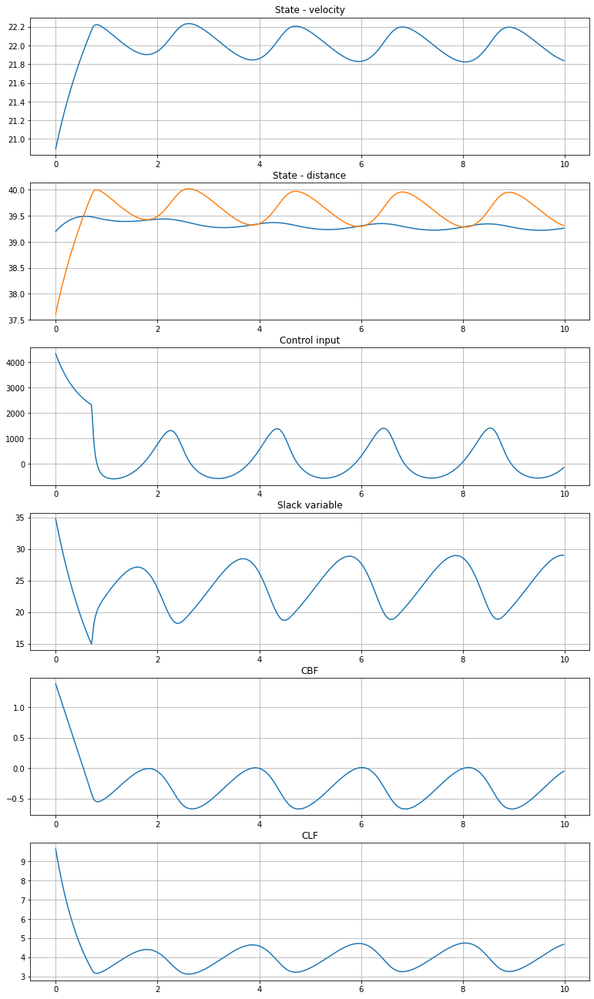

In [24]:
f,ax = plt.subplots(6,1,figsize = (13,23))
t_lns = np.arange(0, 10, dt)
exp = 1


ax[0].plot(t_lns, np.array(x_lst)[exp,:,1])
ax[0].grid(True)
ax[0].set_title('State - velocity')

ax[1].plot(t_lns, np.array(x_lst)[exp,:,2])
ax[1].grid(True)
ax[1].set_title('State - distance')

ax[1].plot(t_lns, Th*np.array(x_lst)[exp,:,1])#  + 0.5*(np.array(x_lst)[exp,:,1] - v_ego)/c_d/g)

ax[2].plot(t_lns, np.array(u_lst)[exp,:])
ax[2].grid(True)
ax[2].set_title('Control input')

ax[3].plot(t_lns, np.array(slack_lst)[exp,:])
ax[3].grid(True)
ax[3].set_title('Slack variable')

ax[4].plot(t_lns, np.array(B_lst)[exp,:])
ax[4].grid(True)
ax[4].set_title('CBF')

ax[5].plot(t_lns, np.array(V_lst)[exp,:])
ax[5].grid(True)
ax[5].set_title('CLF')


In [21]:
t_lns.shape

(500,)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

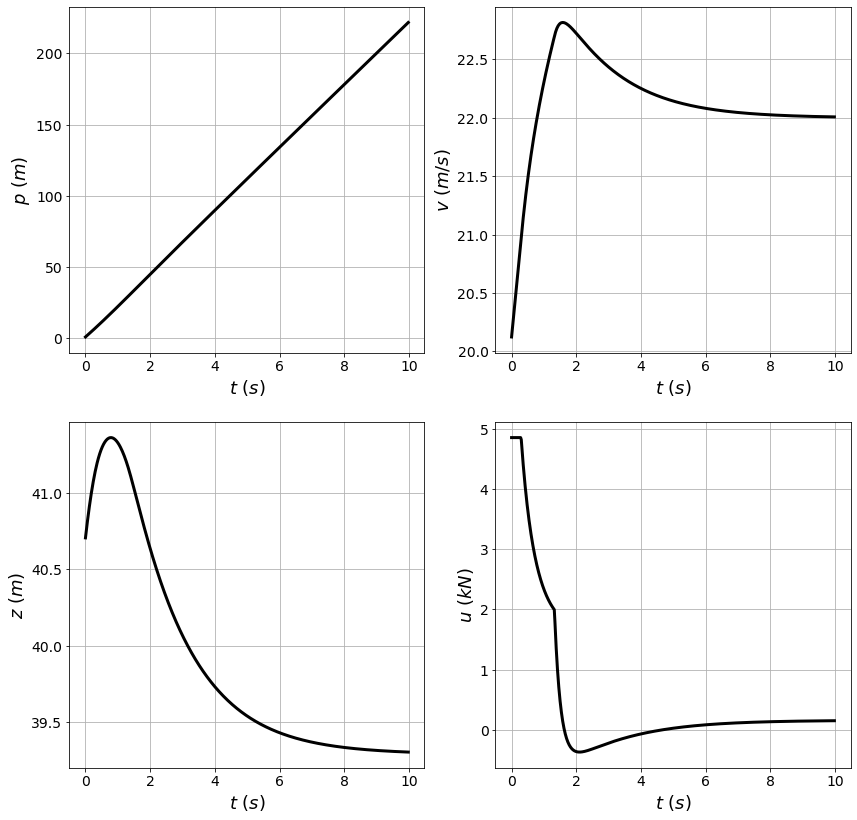

In [100]:
f,ax = plt.subplots(2,2,figsize = (14,14))
t_lns = np.arange(0, 10, dt)
exp = 9

ax[0,0].plot(t_lns, np.array(x_lst)[exp,:,0], 'k', linewidth = 3)
ax[0,0].grid(True)
ax[0,0].set_ylabel('$p$ $(m)$', fontsize = 18)
ax[0,0].set_xlabel('$t$ $(s)$', fontsize = 18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
#ax[0,0].set_title('State - position')

ax[0,1].plot(t_lns, np.array(x_lst)[exp,:,1], 'k', linewidth = 3)
ax[0,1].grid(True)
ax[0,1].set_ylabel('$v$ $(m/s)$', fontsize = 18)
ax[0,1].set_xlabel('$t$ $(s)$', fontsize = 18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
#ax[0,1].set_title('State - velocity')

ax[1,0].plot(t_lns, np.array(x_lst)[exp,:,2],'k', linewidth = 3)
ax[1,0].grid(True)
ax[1,0].set_ylabel('$z$ $(m)$', fontsize = 18)
ax[1,0].set_xlabel('$t$ $(s)$', fontsize = 18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
#ax[1,0].set_title('State - distance')

ax[1,1].plot(t_lns, np.array(u_lst)[exp,:]/1000, 'k', linewidth = 3)
ax[1,1].grid(True)
ax[1,1].set_ylabel('$u$ $(kN)$', fontsize = 18)
ax[1,1].set_xlabel('$t$ $(s)$', fontsize = 18)
#ax[1,1].tick_params(fontsize=14)
plt.yticks(fontsize=14)
plt.setp(ax[0,0].get_xticklabels(), fontsize=14)
plt.setp(ax[0,0].get_yticklabels(), fontsize=14)

plt.setp(ax[0,1].get_xticklabels(), fontsize=14)
plt.setp(ax[0,1].get_yticklabels(), fontsize=14)

plt.setp(ax[1,0].get_xticklabels(), fontsize=14) 
plt.setp(ax[1,0].get_yticklabels(), fontsize=14)



plt.setp(ax[1,1].get_xticklabels(), fontsize=14)
plt.setp(ax[1,1].get_yticklabels(), fontsize=14)


#ax[1,1].set_title('State - distance')

(array([-50.,   0.,  50., 100., 150., 200., 250.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

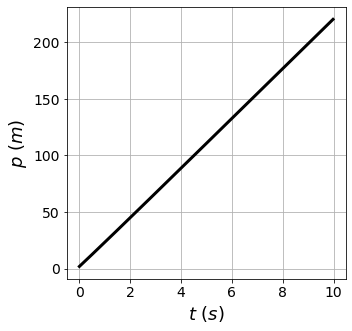

In [122]:
f,ax = plt.subplots(1,1,figsize = (5,5))
t_lns = np.arange(0, 10, dt)
exp = 9

ax.plot(t_lns, np.array(x_lst)[exp,:,0], 'k', linewidth = 3)
ax.grid(True)
ax.set_ylabel('$p$ $(m)$', fontsize = 18)
ax.set_xlabel('$t$ $(s)$', fontsize = 18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
#ax[0,0].set_title('State - position')

(array([18.5, 19. , 19.5, 20. , 20.5, 21. , 21.5, 22. , 22.5, 23. ]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

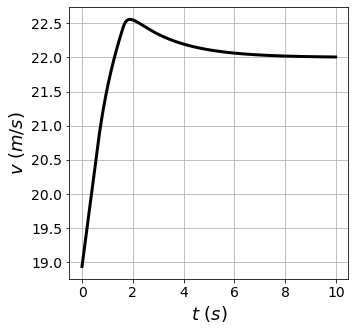

In [121]:
f,ax = plt.subplots(1,1,figsize = (5,5))
t_lns = np.arange(0, 10, dt)
exp = 8

ax.plot(t_lns, np.array(x_lst)[exp,:,1], 'k', linewidth = 3)
ax.grid(True)
ax.set_ylabel('$v$ $(m/s)$', fontsize = 18)
ax.set_xlabel('$t$ $(s)$', fontsize = 18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
#ax[0,0].set_title('State - position')

(array([39.  , 39.25, 39.5 , 39.75, 40.  , 40.25, 40.5 , 40.75, 41.  ,
        41.25]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

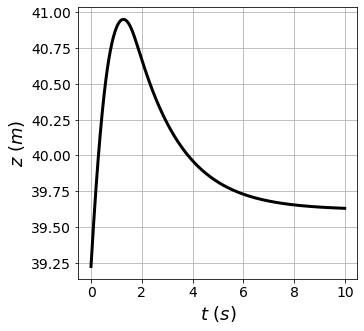

In [123]:
f,ax = plt.subplots(1,1,figsize = (5,5))
t_lns = np.arange(0, 10, dt)
exp = 8

ax.plot(t_lns, np.array(x_lst)[exp,:,2], 'k', linewidth = 3)
ax.grid(True)
ax.set_ylabel('$z$ $(m)$', fontsize = 18)
ax.set_xlabel('$t$ $(s)$', fontsize = 18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

(array([-1.,  0.,  1.,  2.,  3.,  4.,  5.,  6.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

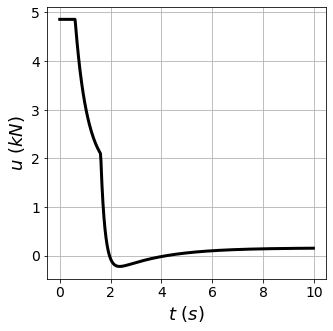

In [120]:
f,ax = plt.subplots(1,1,figsize = (5,5))
t_lns = np.arange(0, 10, dt)
exp = 8

ax.plot(t_lns, np.array(u_lst)[exp,:]/1000, 'k', linewidth = 3)
ax.grid(True)
ax.set_ylabel('$u$ $(kN)$', fontsize = 18)
ax.set_xlabel('$t$ $(s)$', fontsize = 18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

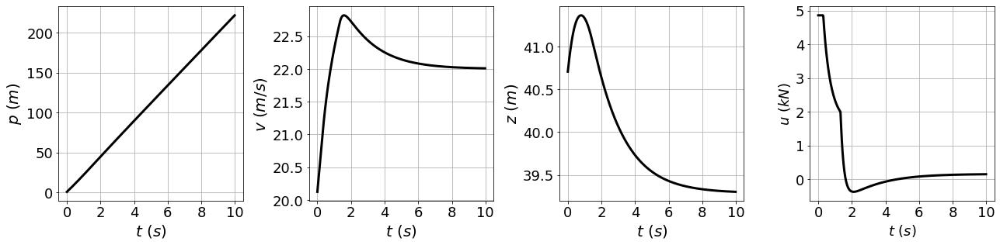

In [99]:
f,ax = plt.subplots(1,4,figsize = (18,4.5))
t_lns = np.arange(0, 10, dt)
exp = 0

ax[0].plot(t_lns, np.array(x_lst)[exp,:,0], 'k', linewidth = 3)
ax[0].grid(True)
ax[0].set_ylabel('$p$ $(m)$', fontsize = 20)
ax[0].set_xlabel('$t$ $(s)$', fontsize = 20)

ax[1].plot(t_lns, np.array(x_lst)[exp,:,1], 'k', linewidth = 3)
ax[1].grid(True)
ax[1].set_ylabel('$v$ $(m/s)$', fontsize = 20)
ax[1].set_xlabel('$t$ $(s)$', fontsize = 20)


ax[2].plot(t_lns, np.array(x_lst)[exp,:,2],'k', linewidth = 3)
ax[2].grid(True)
ax[2].set_ylabel('$z$ $(m)$', fontsize = 20)
ax[2].set_xlabel('$t$ $(s)$', fontsize = 20)

ax[3].plot(t_lns, np.array(u_lst)[exp,:]/1000, 'k', linewidth = 3)
ax[3].grid(True)
ax[3].set_ylabel('$u$ $(kN)$', fontsize = 18)
ax[3].set_xlabel('$t$ $(s)$', fontsize = 18)



plt.setp(ax[0].get_xticklabels(), fontsize=18)
plt.setp(ax[0].get_yticklabels(), fontsize=18)

plt.setp(ax[1].get_xticklabels(), fontsize=18)
plt.setp(ax[1].get_yticklabels(), fontsize=18)

plt.setp(ax[2].get_xticklabels(), fontsize=18) 
plt.setp(ax[2].get_yticklabels(), fontsize=18)

plt.setp(ax[3].get_xticklabels(), fontsize=18)
plt.setp(ax[3].get_yticklabels(), fontsize=18)

f.tight_layout() 
#ax[1,1].set_title('State - distance')

### Barrier function

(array([-2., -1.,  0.,  1.,  2.,  3.,  4.,  5.,  6.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

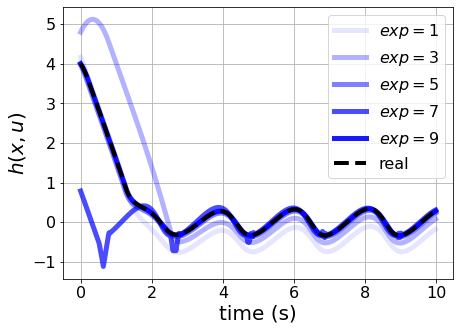

In [25]:
f,ax = plt.subplots(1,1,figsize = (7,5))
t_lns = np.arange(0, 10, dt)
exp = 8

start = 0



for exp in range(10):
    if exp % 2 == 0:
        h = np.array(x_lst)[exp,start:,2] - Th*np.array(x_lst)[exp,start:,1]  - 0.5*(np.array(x_lst)[exp,start:,1] - v_ego)/c_d/g
        h = np.array(B_lst)[exp,start:]
        ax.plot(t_lns[start:], h , 'blue', alpha = 0.1 * (exp + 1), linewidth = 5)
        #print(exp)
        
h_perf = np.array(B_lst)[exp,start:]
ax.plot(t_lns[start:], h,'black',linewidth = 4, linestyle = '--')

ax.grid(True)
#ax.set_title('Barrier function evolution in multiple experiences', fontsize= 18)
ax.legend(['$exp=1$','$exp=3$','$exp=5$','$exp=7$','$exp=9$','real'],fontsize= 16) 
ax.set_xlabel('time (s)', fontsize= 20)
ax.set_ylabel('$h(x, u)$', fontsize= 20)

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)



### Lyapunov function

Text(0, 0.5, '$V(x, u)$')

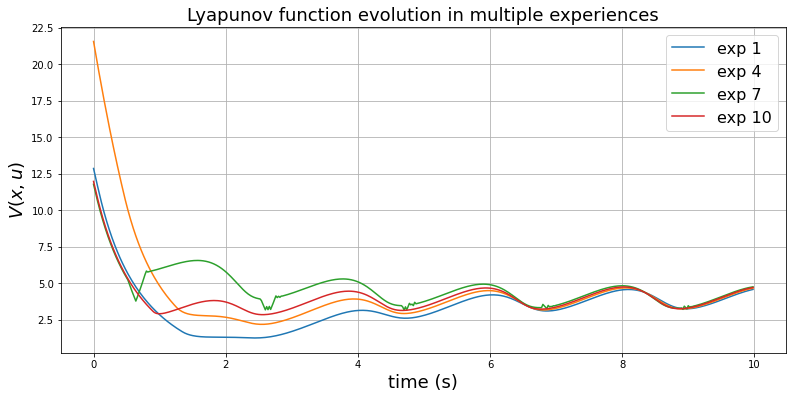

In [26]:
f,ax = plt.subplots(1,1,figsize = (13,6))
t_lns = np.arange(0, 10, dt)
exp = 8

start = 0

for exp in range(10):
    if exp % 3 == 0:
        V = np.array(V_lst)[exp,start:]
        ax.plot(t_lns[start:], V )
        #print(exp)
        
ax.grid(True)
ax.set_title('Lyapunov function evolution in multiple experiences', fontsize= 18)
ax.legend(['exp 1','exp 4','exp 7','exp 10'],fontsize= 16) 
ax.set_xlabel('time (s)', fontsize= 18)
ax.set_ylabel('$V(x, u)$', fontsize= 18)

### Comparison with perfect knowledge

In [1]:
f,ax = plt.subplots(1,1,figsize = (13,6))
t_lns = np.arange(0, 10, dt)

start = 0
exp = 0

h_perf = np.array(B_perf_lst)[exp,start:]
ax.plot(t_lns[start:], h_perf, 'black',linewidth = 3 )

h_perf = np.array(B_lst)[exp,start:]
ax.plot(t_lns[start:], h,'blue',linewidth = 3)
#print(exp)
        
ax.grid(True)
ax.set_title('Estimated barrier function vs real barrier function for $exp = 1$', fontsize= 18)
ax.legend(['estimated','real'],fontsize= 16) 
ax.set_xlabel('time (s)', fontsize= 18)
ax.set_ylabel('$h(x, u)$', fontsize= 18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

NameError: name 'plt' is not defined

(array([-1.,  0.,  1.,  2.,  3.,  4.,  5.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

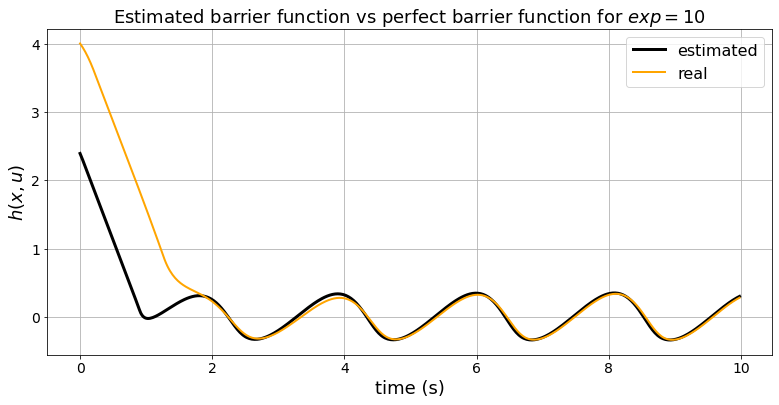

In [28]:
f,ax = plt.subplots(1,1,figsize = (13,6))
t_lns = np.arange(0, 10, dt)

start = 0
exp = 9

h_perf = np.array(B_perf_lst)[exp,start:]
ax.plot(t_lns[start:], h_perf, 'black',linewidth = 3 )

h_perf = np.array(B_lst)[exp,start:]
ax.plot(t_lns[start:], h,'orange',linewidth = 2)
#print(exp)
        
ax.grid(True)
ax.set_title('Estimated barrier function vs perfect barrier function for $exp = 10$', fontsize= 18)
ax.legend(['estimated','real'],fontsize= 16) 
ax.set_xlabel('time (s)', fontsize= 18)
ax.set_ylabel('$h(x, u)$', fontsize= 18)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

### Estimator evolution

(array([-2.5, -2. , -1.5, -1. , -0.5,  0. ,  0.5]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

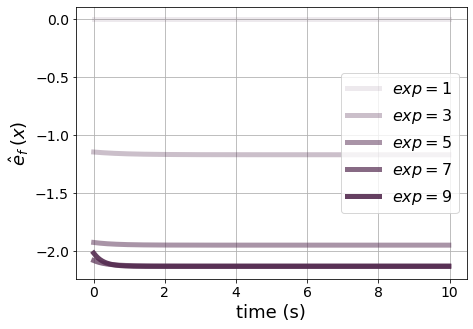

In [29]:
f,ax = plt.subplots(1,1,figsize = (7,5))
t_lns = np.arange(0, 10, dt)
exp = 8

start = 0

for exp in range(10):
    if exp % 2 == 0:
        V = np.array(a_h_lst)[exp,start:]
        ax.plot(t_lns[start:], V , color = (0.329, 0.168, 0.313), alpha = 0.1 * (exp + 1), linewidth = 5)
        #print(exp)
        
ax.grid(True)
#ax.set_title('Evolution of estimator $e_f$', fontsize= 18)
ax.legend(['$exp=1$','$exp=3$','$exp=5$','$exp=7$','$exp=9$','real'],fontsize= 16) 
ax.set_xlabel('time (s)', fontsize= 18)
ax.set_ylabel('$\hat{e}_f\:(x)$', fontsize= 18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

(array([-0.0001,  0.    ,  0.0001,  0.0002,  0.0003,  0.0004,  0.0005,
         0.0006,  0.0007,  0.0008]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

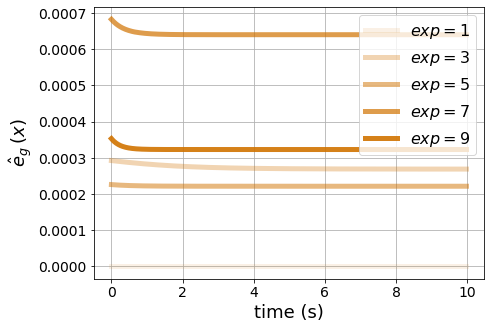

In [30]:
f,ax = plt.subplots(1,1,figsize = (7,5))
t_lns = np.arange(0, 10, dt)
exp = 8

start = 0

for exp in range(10):
    if exp % 2 == 0:
        V = np.array(b_h_lst)[exp,start:]
        ax.plot(t_lns[start:], V, color = (0.819, 0.450, 0), alpha = 0.1 * (exp + 1), linewidth = 5 )
        #print(exp) 
        
ax.grid(True)
#ax.set_title('Evolution of estimator $e_g$', fontsize= 18)
ax.legend(['$exp=1$','$exp=3$','$exp=5$','$exp=7$','$exp=9$','real'],fontsize= 16) 
ax.set_xlabel('time (s)', fontsize= 18)
ax.set_ylabel('$\hat{e}_g\:(x)$', fontsize= 18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

(array([35., 36., 37., 38., 39., 40., 41., 42., 43., 44.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

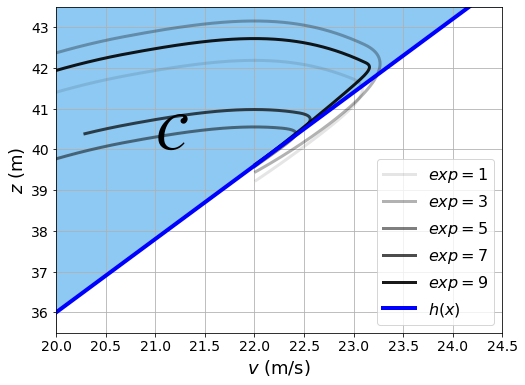

In [18]:
f,ax = plt.subplots(1,1,figsize = (8,6))
t_lns = np.arange(0, 10, dt)

start = 0
exp = 9

#h_perf = np.array(B_perf_lst)[exp,start:]

for exp in range(10):
    if exp % 2 == 0:
        z = np.array(x_lst)[exp,start:,2]# np.array(B_lst)[exp,start:]
        v = np.array(x_lst)[exp,start:,1]
        ax.plot(v, z, 'black', alpha = 0.1 * (exp + 1), linewidth = 3)
        

        
        
ax.grid(True)
#ax.set_title('Safe distance performance vs velocity. $z \geq T_h v$', fontsize= 18)
#ax.legend(['estimated','real'],fontsize= 16) 
ax.set_ylabel('$z$ (m)', fontsize= 18)
ax.set_xlabel('$v$ (m/s)', fontsize= 18)

v_min = 20
v_max = 24.5
z_min = 35.5
z_max = 43.5

v_span = np.linspace(v_min, v_max, 50)
ax.plot(v_span, v_span*Th, 'blue',linewidth = 4 )


ax.legend(['$exp=1$','$exp=3$','$exp=5$','$exp=7$','$exp=9$','$h(x)$'],fontsize= 16) 
plt.gca().fill_between(v_span, v_span*Th, z_max, v_span > 0, color = (0.552, 0.788, 0.949))
ax.set_ylim(z_min, z_max)
ax.set_xlim(v_min, v_max)

ax.text(21,40,'$\mathcal{C}$', fontsize=54)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

In [ ]:
f,ax = plt.subplots(1,1,figsize = (13,6))
t_lns = np.arange(0, 10, dt)

start = 0

for exp in range(10):
    if exp % 3 == 0:
        h_ = np.array(B_perf_lst)[exp,start:]
        ax.plot(t_lns[start:], h )
        #print(exp)
        
ax.grid(True)
ax.set_title('Barrier function evolution in multiple experiences', fontsize= 18)
ax.legend(['exp 1','exp 4','exp 7','exp 10'],fontsize= 16) 
ax.set_xlabel('time (s)', fontsize= 18)
ax.set_ylabel('$V(x, u)$', fontsize= 18)

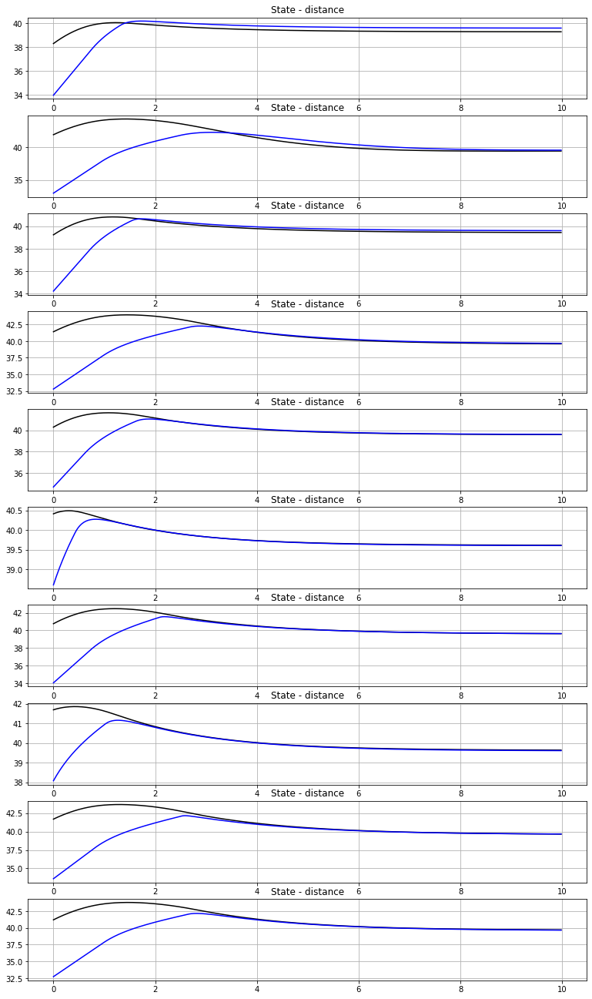

In [73]:
f,ax = plt.subplots(10,1,figsize = (13,23))
t_lns = np.arange(0, 10, dt)

for exp in range(10):
    ax[exp].plot(t_lns, np.array(x_lst)[exp,:,2],'black')
    ax[exp].grid(True)
    ax[exp].set_title('State - distance')

    ax[exp].plot(t_lns, Th*np.array(x_lst)[exp,:,1], 'blue')

### First time

IndexError: index 19 is out of bounds for axis 0 with size 10

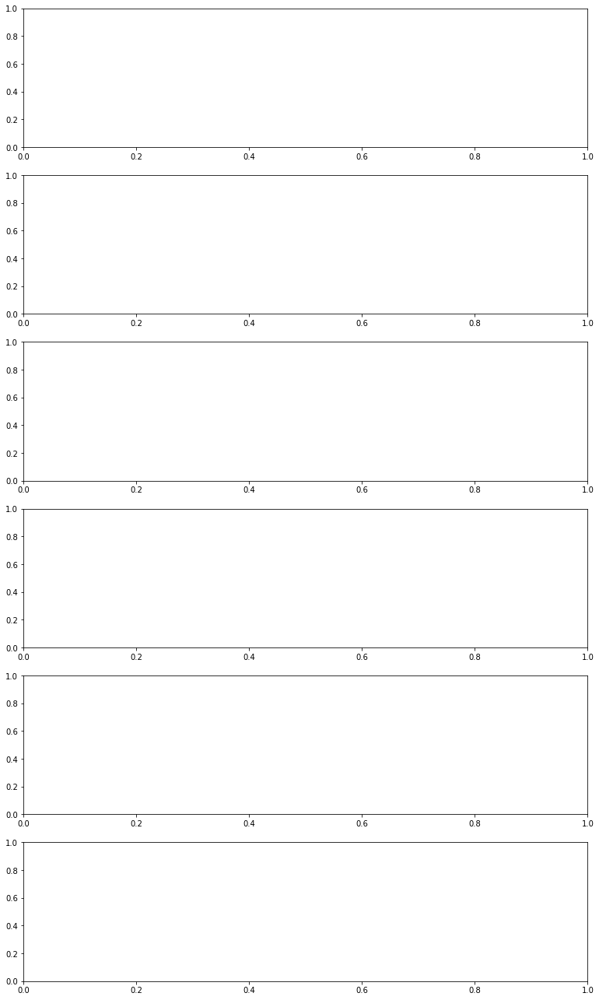

In [12]:
f,ax = plt.subplots(6,1,figsize = (13,23))
t_lns = np.arange(0, 20, dt)

exp = 19

ax[0].plot(t_lns, np.array(x_lst)[exp,:,1])
ax[0].grid(True)
ax[0].set_title('State - velocity')

ax[1].plot(t_lns, np.array(x_lst)[exp,:,2])
ax[1].grid(True)
ax[1].set_title('State - distance')

ax[1].plot(t_lns, Th*np.array(x_lst)[0,:,1])

ax[2].plot(t_lns, np.array(u_lst)[exp,:])
ax[2].grid(True)
ax[2].set_title('Control input')

ax[3].plot(t_lns, np.array(slack_lst)[exp,:])
ax[3].grid(True)
ax[3].set_title('Slack variable')

ax[4].plot(t_lns, np.array(B_lst)[exp,:])
ax[4].grid(True)
ax[4].set_title('CBF')

ax[5].plot(t_lns, np.array(V_lst)[exp,:])
ax[5].grid(True)
ax[5].set_title('CLF')

In [ ]:
d = Dataset()
T = 10   # Number of experiences

aac = AAC(m, c_d, f0, f1, f2, v_ego)

cont = LQPCBFCLF(m, c_a, c_d, f0_nom, f1_nom, f2_nom, v_ego, v_des, Th, clf_rate, cbf_rate, p_slack)

A_h = Estimator(3)
A_h_opt = torch.optim.Adam(A_h.model.parameters(), lr = 1e-4)

B_h = Estimator(3)
B_h_opt = torch.optim.Adam(B_h.model.parameters(), lr = 1e-4)


weights = 0.2

x_lst = []
u_lst = []
V_lst = []
B_lst = []
slack_lst = []


a_h_lst = []
b_h_lst = []


for _ in range(T):
    x0 = sample_initial_state()
    x = x0
    derivator = Derivator(dt)
    
    xs = []
    us = []
    Vs = []
    Bs = []
    slacks = []
    b_hs = []
    a_hs = []
    
    # Train
    for t in np.arange(0, simTime, dt): #simTime
        # Get Fr
        v = x[1]
        Fr = f0_nom * v**2 + f1_nom * v + f2_nom

        # Control Input
        a_h, b_h, k, slack_sol, V, B, db_hat = cont.compute_controller(x, Fr, A_h, B_h, weights)

        # One step propagation in the system
        x_n = aac.update(x, k, t, dt)
        
        db = derivator.update(B)
        
        d.update(x, k, db, db_hat)
        
    
    # Test
    x = [0,20,40]
    for t in np.arange(0, simTime, dt): #simTime
        # Get Fr
        v = x[1]
        Fr = f0_nom * v**2 + f1_nom * v + f2_nom

        # Control Input
        a_h, b_h, k, slack_sol, V, B, db_hat = cont.compute_controller(x, Fr, A_h, B_h, weights)

        # One step propagation in the system
        x_n = aac.update(x, k, t, dt)
 
        xs.append(x)
        us.append(k)
        Vs.append(V)
        Bs.append(B)
        slacks.append(slack_sol)
        a_hs.append(a_h)
        b_hs.append(b_h)
        
        x = x_n
        
        
    # Save data
    x_lst.append(xs)
    u_lst.append(us)
    V_lst.append(Vs)
    B_lst.append(Bs)
    slack_lst.append(slacks)
    a_h_lst.append(a_hs)
    b_h_lst.append(b_hs)

    # Train estimator
    sample = d.get_D()
        
    for x_i, k_i, dh_i, dh_hat_i in zip(sample.x, sample.k, sample.dh, sample.dh_hat ):
        S_i = A_h.forward(x_i, train = True) + B_h.forward(x_i, train = True)*k_i + cont.dcbf(x_i, k_i) # dh_hat_i
        
        Loss = F.mse_loss(torch.tensor(dh_i),S_i)

        A_h.model.zero_grad()
        B_h.model.zero_grad()

        Loss.backward()
        A_h_opt.step()
        B_h_opt.step()
    
        
        

